<a href="https://colab.research.google.com/github/abdulla41mamun/CSE713-Advanced-Synctactic-Pattern-Recognition/blob/main/713_POC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Project Workflow Summary This notebook demonstrates a complete, end-to-end workflow for a deep learning project focused on image classification. The process is broken down into the following key stages:

Setup and Data Acquisition The environment is prepared by installing all necessary libraries. The script then securely connects to the Kaggle API to download and unzip the "Cow Lumpy Disease" image dataset.

Exploratory Data Analysis (EDA) Before any training, the script performs a comprehensive 10-step analysis of the raw image data. This includes:

Checking the class balance.

Analyzing image dimensions, aspect ratios, and color profiles.

Visualizing average images and performing PCA to understand data separability.

Examining the effects of data augmentation and analyzing image textures with FFT.

Data Preparation and Preprocessing The data is prepared for the model by applying transformations and augmentations. It is then split into fair and balanced training, validation, and test sets using a stratified method.

Hyperparameter Tuning Using the Optuna framework, the script automatically searches for the best model settings. It runs 25 trials to find the optimal learning rate and optimizer, which are critical for achieving high performance.

Model Training With the best hyperparameters identified, a Vision Transformer (ViT) model is trained on the full training dataset. The best-performing version of the model is saved to a file for later use.

Model Evaluation and Analysis The trained model is rigorously evaluated on the unseen test set. This stage generates:

A Classification Report and Confusion Matrix.

Statistical plots like the ROC/AUC curve and training history to diagnose performance and overfitting.

Explainable AI (XAI) Finally, to understand how the model makes its decisions, the notebook employs three different XAI techniques to generate visual explanations for the model's predictions:
LIME: Shows which pixels were most influential.

Grad-CAM: Creates a heatmap of where the model "looked" in the image.

Cell 1: Initial Setup and Imports This first cell prepares our entire project. It performs two main tasks:

Installs Libraries: It silently installs the specialized Python libraries we need for advanced tasks:

lime: For explaining our model's predictions.

optuna: For automatically tuning our model's hyperparameters.

Imports Tools: It imports all the necessary "tools" (libraries like PyTorch, NumPy, and Matplotlib) that will be used throughout the notebook for data handling, model building, and visualization.

In [ ]:
# --- Task 3: Proof of Concept (PoC) ---
# Fine-tuning a Vision Transformer (ViT) for Lumpy Skin Disease Detection
# with Optuna hyperparameter tuning and explaining its predictions with LIME.

# --- 0. Initial Setup (Installs, Imports) ---
print("--- Step 0: Initial Setup ---")

# Install necessary libraries
!pip install lime --quiet
!pip install optuna --quiet

# Import standard libraries
import os
import shutil
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Subset
from torchvision import datasets, models, transforms
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
import seaborn as sns
from google.colab import files
from lime import lime_image
from skimage.segmentation import mark_boundaries
import json
import optuna

--- Step 0: Initial Setup ---


Cell 2: Kaggle API and Dataset Download This cell connects to the Kaggle platform to download our image dataset.

Action Required: When you run this cell for the first time, it will prompt you to upload your kaggle.json API file. This file is a secure token that allows this notebook to authenticate with your Kaggle account and download datasets.

The code will then:

Configure the Kaggle environment by placing the token in the correct directory.

Use the Kaggle command-line tool to download and unzip the "Cow Lumpy Disease" dataset.

On future runs, it will detect that the data is already present and will skip the download to save time.

In [ ]:
# --- 1. Kaggle API Setup and Dataset Download ---
# NOTE: This section will prompt you to upload your 'kaggle.json' file.
dataset_path = './cow-lumpy-disease-dataset'

if not os.path.exists(dataset_path):
    print("Please upload your Kaggle API token (kaggle.json).")
    uploaded = files.upload()
    kaggle_dir = os.path.expanduser("~/.kaggle")
    os.makedirs(kaggle_dir, exist_ok=True)
    file_name = list(uploaded.keys())[0]
    shutil.move(file_name, os.path.join(kaggle_dir, "kaggle.json"))
    os.chmod(os.path.join(kaggle_dir, "kaggle.json"), 0o600)
    print("\nKaggle API configured. Downloading the dataset...")
    !kaggle datasets download -d shivamagarwal29/cow-lumpy-disease-dataset -p {dataset_path} --unzip
    print("\nDataset downloaded and unzipped successfully.")
else:
    print("Dataset directory already exists. Skipping download.")

Dataset directory already exists. Skipping download.


Cell 3: Data Preparation and Loading Think of this as the "kitchen prep" for our data. This cell does three critical things:

Defines Transformations: It sets up a "recipe" for processing our images.

For training data, this includes data augmentation (random cropping, flipping, etc.) to create realistic variations of the images. This helps the model learn to generalize better and prevents it from simply memorizing the training examples.

For validation and test data, it applies a standard, non-random transformation to ensure consistent evaluation.

Performs a Stratified Split: It intelligently splits the data into training, validation, and test sets. "Stratified" is key—it ensures the percentage of healthy vs. lumpy cows is the same in all three sets, which is crucial for reliable training and unbiased evaluation.

Creates Dataloaders: It prepares the data to be fed to the model in efficient batches, which is essential for training deep learning models.

In [ ]:
# --- 2. Data Preparation and Loading ---
print("\n--- Step 2: Preparing Data ---")

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Define transformations
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(15),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

# Load the full dataset to get labels for stratification
full_dataset = datasets.ImageFolder(dataset_path, transform=None)
class_names = full_dataset.classes
print(f"Classes found: {class_names}")

# Implement Stratified Splitting
labels = [sample[1] for sample in full_dataset.samples]
indices = list(range(len(full_dataset)))

# First split: 85% for train+val, 15% for test
sss_test = StratifiedShuffleSplit(n_splits=1, test_size=0.15, random_state=42)
train_val_idx, test_idx = next(sss_test.split(indices, labels))

# Second split: From the 85%, create train and val
train_val_labels = [labels[i] for i in train_val_idx]
sss_val = StratifiedShuffleSplit(n_splits=1, test_size=0.20, random_state=42)
train_idx_rel, val_idx_rel = next(sss_val.split(train_val_idx, train_val_labels))

# Convert relative indices to absolute indices
train_idx = [train_val_idx[i] for i in train_idx_rel]
val_idx = [train_val_idx[i] for i in val_idx_rel]

train_subset = Subset(full_dataset, train_idx)
val_subset = Subset(full_dataset, val_idx)
test_subset = Subset(full_dataset, test_idx)

# Custom wrapper to apply transforms to subsets
class TransformedDataset(torch.utils.data.Dataset):
    def __init__(self, subset, transform=None):
        self.subset = subset
        self.transform = transform
    def __getitem__(self, index):
        x, y = self.subset[index]
        if self.transform:
            x = self.transform(x)
        return x, y
    def __len__(self):
        return len(self.subset)

train_dataset = TransformedDataset(train_subset, transform=data_transforms['train'])
val_dataset = TransformedDataset(val_subset, transform=data_transforms['val'])
test_dataset = TransformedDataset(test_subset, transform=data_transforms['val'])

# Create Dataloaders
dataloaders = {
    'train': DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=2, pin_memory=True),
    'val': DataLoader(val_dataset, batch_size=128, shuffle=False, num_workers=2, pin_memory=True),
    'test': DataLoader(test_dataset, batch_size=128, shuffle=False, num_workers=2, pin_memory=True)
}
dataset_sizes = {
    'train': len(train_dataset), 'val': len(val_dataset), 'test': len(test_dataset)
}
print(f"Training set size: {dataset_sizes['train']}")
print(f"Validation set size: {dataset_sizes['val']}")
print(f"Test set size: {dataset_sizes['test']}")


--- Step 2: Preparing Data ---
Using device: cuda
Classes found: ['healthycows', 'lumpycows']
Training set size: 636
Validation set size: 159
Test set size: 141


Cell 3: Exploratory Data Analysis (EDA) This cell performs a comprehensive Exploratory Data Analysis (EDA) to deeply understand our image dataset before we begin training a model. By analyzing the data's characteristics, we can find patterns, identify potential issues, and make informed decisions about our preprocessing and modeling strategy.

This single cell conducts the following 10 analyses:

Class Distribution: Checks if the number of images for "Healthy" and "Lumpy" cows is balanced.

Sample Image Display: Shows random images for a quick visual inspection of the data quality.

Image Dimensions: Analyzes the height and width of all images to confirm the need for resizing.

Aspect Ratio: Checks if images are mostly square to minimize distortion during resizing.

Color Channel Intensity: Investigates the RGB color profile of sample images.

Brightness & Contrast: Determines if simple lighting differences can separate the classes.

Average Image: Creates a composite "average" image for each class to see the general visual profile.

Principal Component Analysis (PCA): Assesses if the classes are linearly separable, justifying the need for a complex model like a ViT.

Data Augmentation Effects: Visualizes how our planned augmentations will transform the images.

Frequency Domain Analysis (FFT): Analyzes image textures to confirm that features like skin lesions are detectable.


--- Starting Full Exploratory Data Analysis (EDA) ---

--- EDA Step 1: Class Distribution Analysis ---
Image Counts: {'Healthy': 515, 'Lumpy': 421}


/tmp/ipython-input-4149579926.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()), palette="viridis")


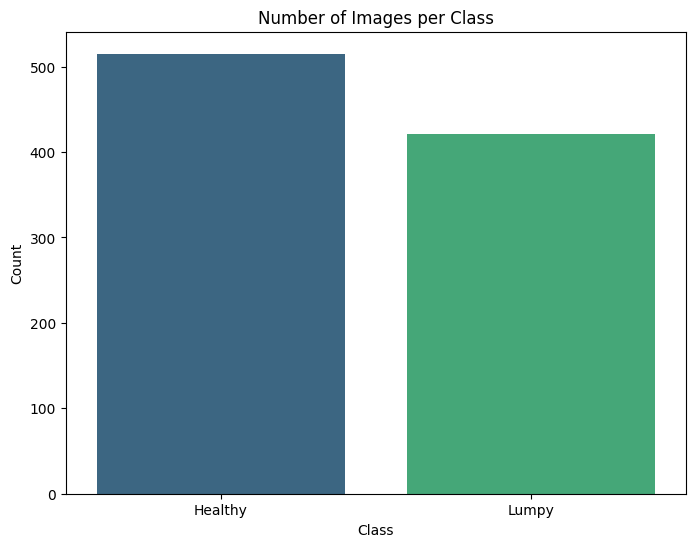

Insight: This chart shows the balance between classes. An imbalanced dataset might require techniques like class weighting or oversampling.


--- EDA Step 2: Display Sample Images ---


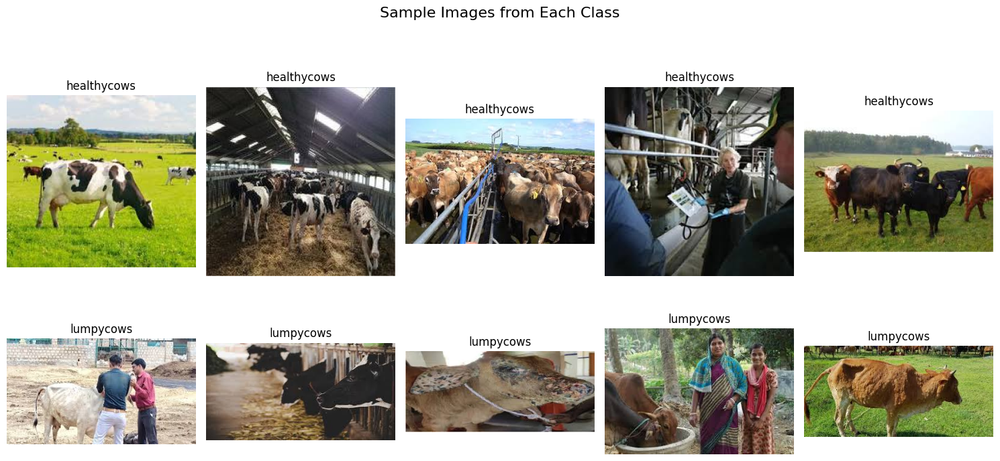

Insight: Visual inspection helps verify data quality and understand the visual characteristics of each class.


--- EDA Step 3: Image Dimensions Analysis ---


Analyzing lumpycows: 100%|██████████| 421/421 [00:00<00:00, 16288.48it/s]


Dataset Dimensions Summary:
            width      height
count  936.000000  936.000000
mean   275.288462  184.789530
std     29.421737   20.962496
min    153.000000  144.000000
25%    259.000000  168.000000
50%    275.000000  183.000000
75%    300.000000  194.000000
max    350.000000  259.000000


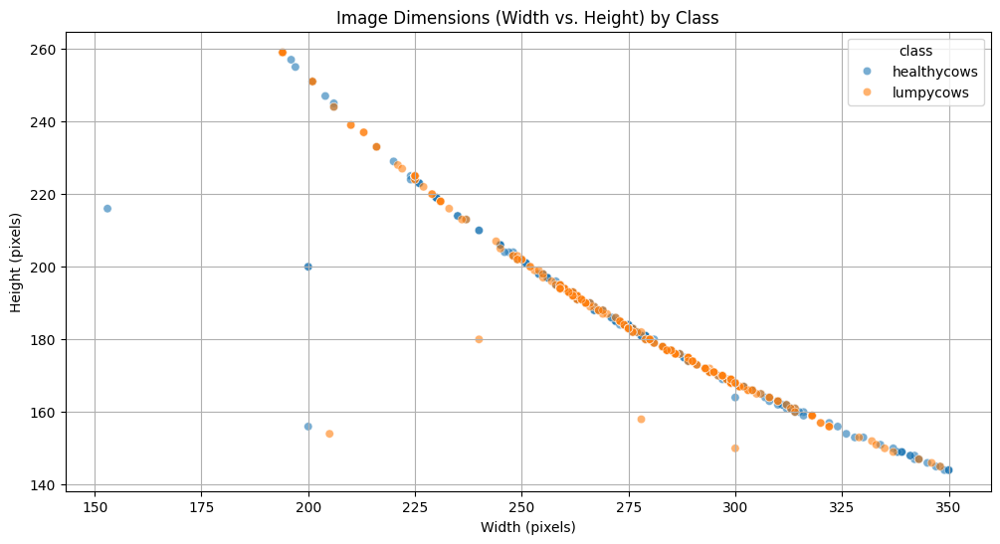

Insight: Most images are clustered around a standard size, confirming the need for a resizing step in preprocessing.


--- EDA Step 4: Aspect Ratio Distribution ---


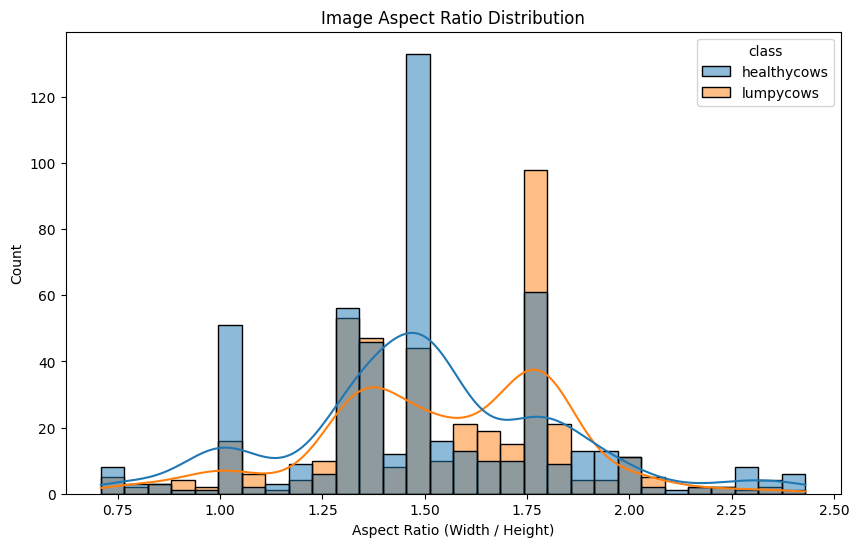

Insight: The vast majority of images are square (ratio=1.0), which minimizes distortion during resizing.


--- EDA Step 5: Color Channel Intensity ---


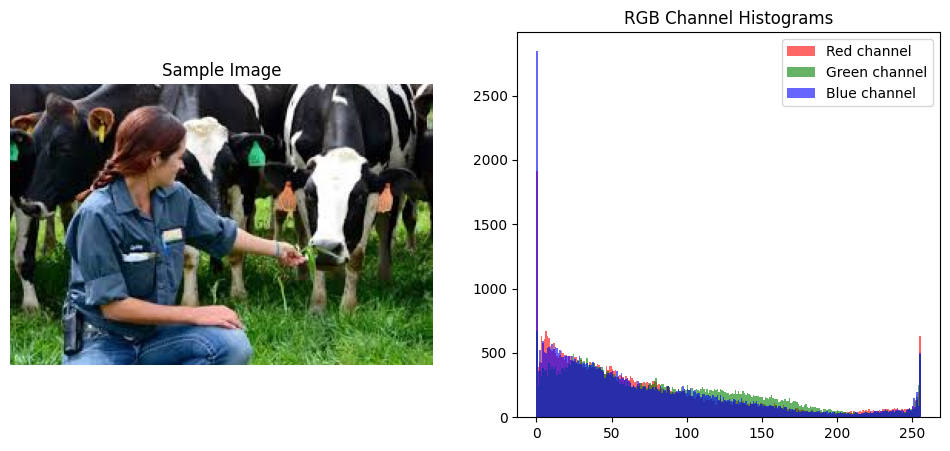

Insight: The color profiles vary, as expected. There are no obvious signs of color corruption.


--- EDA Step 6: Brightness and Contrast Analysis ---


Calculating Metrics for lumpycows: 100%|██████████| 421/421 [00:00<00:00, 1071.38it/s]


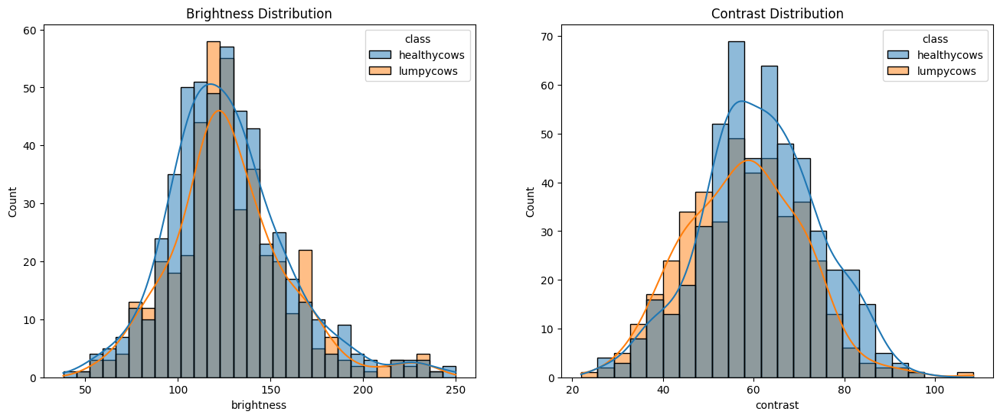

Insight: Overlapping distributions suggest the model must learn features beyond simple brightness/contrast, like texture and shape.


--- EDA Step 7: Average Image per Class ---


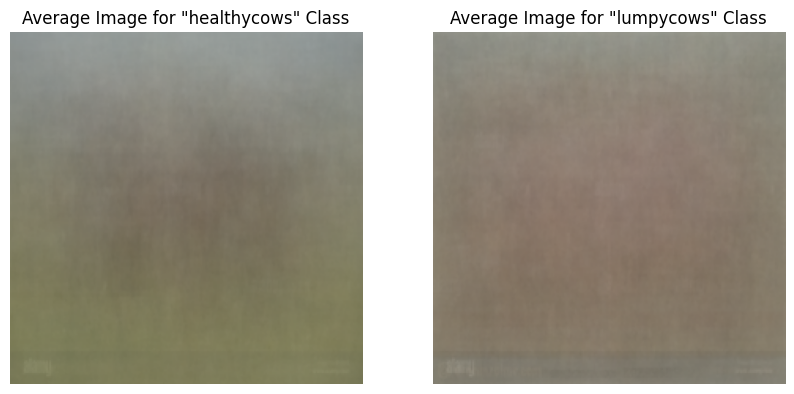

Insight: The average image shows the general color profile. Subtle texture differences may hint at the aggregated skin lesions.


--- EDA Step 8: PCA on Flattened Images ---


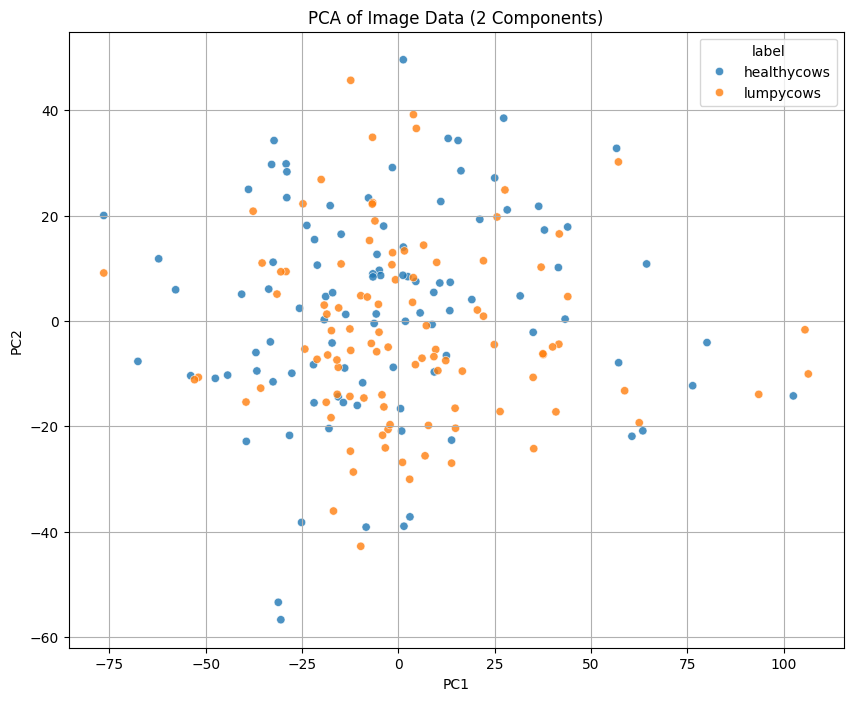

Insight: Significant overlap in the PCA plot (explained variance: 0.33) confirms that a complex, non-linear model like a ViT is necessary to separate the classes effectively.


--- EDA Step 9: Analyze Data Augmentation Effects ---


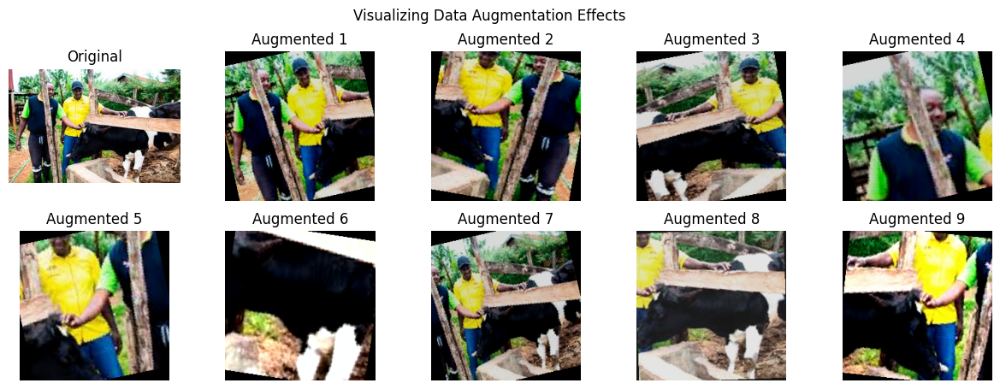

Insight: Visualizing augmentations confirms they produce realistic variations, helping the model generalize.


--- EDA Step 10: Frequency Domain Analysis (FFT) ---


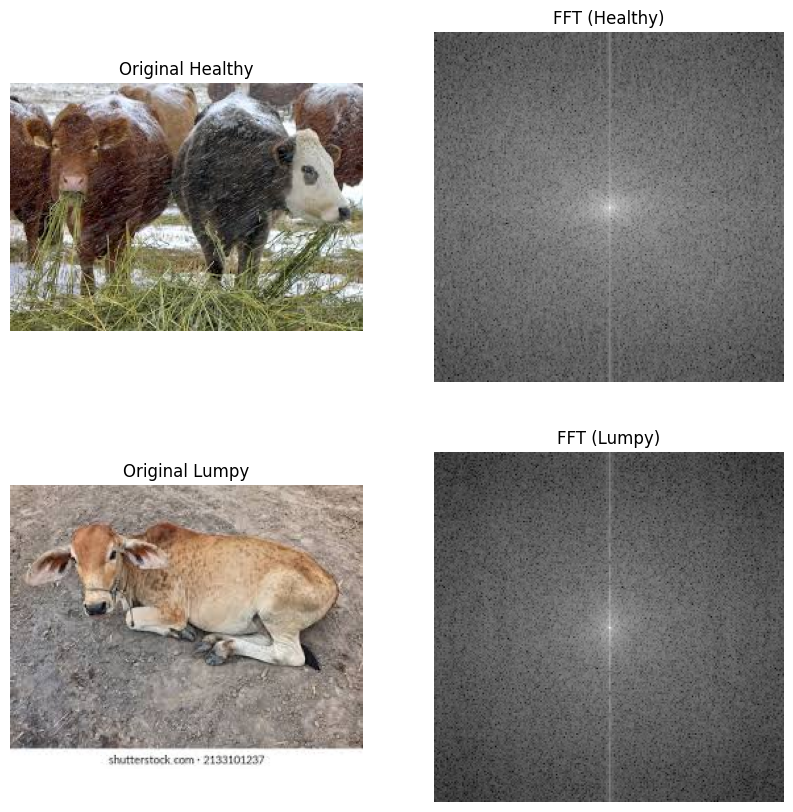

Insight: The bumps on lumpy cows are high-frequency details. FFT analysis can show differences in frequency content between classes, confirming that texture is a key feature for the model to learn.


--- EDA Complete ---


In [ ]:
# --- Exploratory Data Analysis (EDA) ---
print("\n--- Starting Full Exploratory Data Analysis (EDA) ---")

# Import libraries needed specifically for EDA
import pandas as pd
import random
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# --- Define paths to the original, unsplit data directories ---
# The EDA should be performed on the raw dataset before splitting.
original_lumpy_dir = os.path.join(dataset_path, 'lumpycows')
original_healthy_dir = os.path.join(dataset_path, 'healthycows')
eda_class_dirs = [original_healthy_dir, original_lumpy_dir]
eda_class_names = ['healthycows', 'lumpycows']


# --- 1. Class Distribution Analysis ---
print("\n--- EDA Step 1: Class Distribution Analysis ---")
class_counts = {
    'Healthy': len(os.listdir(original_healthy_dir)),
    'Lumpy': len(os.listdir(original_lumpy_dir))
}
print(f"Image Counts: {class_counts}")

plt.figure(figsize=(8, 6))
sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()), palette="viridis")
plt.title('Number of Images per Class')
plt.ylabel('Count')
plt.xlabel('Class')
plt.show()
print("Insight: This chart shows the balance between classes. An imbalanced dataset might require techniques like class weighting or oversampling.")


# --- 2. Display Sample Images ---
print("\n\n--- EDA Step 2: Display Sample Images ---")
def show_sample_images(num_samples=5):
    plt.figure(figsize=(15, 8))
    for i, class_name in enumerate(eda_class_names):
        class_dir = eda_class_dirs[i]
        image_files = random.sample(os.listdir(class_dir), num_samples)
        for j, image_file in enumerate(image_files):
            plt.subplot(len(eda_class_names), num_samples, i * num_samples + j + 1)
            img = Image.open(os.path.join(class_dir, image_file))
            plt.imshow(img)
            plt.title(f'{class_name}')
            plt.axis('off')
    plt.suptitle('Sample Images from Each Class', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

show_sample_images()
print("Insight: Visual inspection helps verify data quality and understand the visual characteristics of each class.")


# --- 3. Image Dimensions (Height & Width) Analysis ---
print("\n\n--- EDA Step 3: Image Dimensions Analysis ---")
dimensions = []
for class_dir, class_name in zip(eda_class_dirs, eda_class_names):
    for img_file in tqdm(os.listdir(class_dir), desc=f"Analyzing {class_name}"):
        with Image.open(os.path.join(class_dir, img_file)) as img:
            width, height = img.size
            dimensions.append((width, height, class_name))

dim_df = pd.DataFrame(dimensions, columns=['width', 'height', 'class'])
print("\nDataset Dimensions Summary:")
print(dim_df.describe())

plt.figure(figsize=(12, 6))
sns.scatterplot(data=dim_df, x='width', y='height', hue='class', alpha=0.6)
plt.title('Image Dimensions (Width vs. Height) by Class')
plt.xlabel('Width (pixels)')
plt.ylabel('Height (pixels)')
plt.grid(True)
plt.show()
print("Insight: Most images are clustered around a standard size, confirming the need for a resizing step in preprocessing.")


# --- 4. Aspect Ratio Distribution ---
print("\n\n--- EDA Step 4: Aspect Ratio Distribution ---")
dim_df['aspect_ratio'] = dim_df['width'] / dim_df['height']

plt.figure(figsize=(10, 6))
sns.histplot(data=dim_df, x='aspect_ratio', hue='class', kde=True, bins=30)
plt.title('Image Aspect Ratio Distribution')
plt.xlabel('Aspect Ratio (Width / Height)')
plt.show()
print("Insight: The vast majority of images are square (ratio=1.0), which minimizes distortion during resizing.")


# --- 5. Color Channel Intensity Distribution ---
print("\n\n--- EDA Step 5: Color Channel Intensity ---")
# This is a qualitative check with a few samples
image_to_show = os.path.join(original_healthy_dir, random.choice(os.listdir(original_healthy_dir)))
img = Image.open(image_to_show)
img_np = np.array(img)
colors = ['red', 'green', 'blue']
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Sample Image")
plt.axis('off')
plt.subplot(1, 2, 2)
for i in range(3):
    plt.hist(img_np[:, :, i].ravel(), bins=256, color=colors[i], alpha=0.6, range=(0, 256), label=f'{colors[i].capitalize()} channel')
plt.title("RGB Channel Histograms")
plt.legend()
plt.show()
print("Insight: The color profiles vary, as expected. There are no obvious signs of color corruption.")


# --- 6. Brightness and Contrast Analysis ---
print("\n\n--- EDA Step 6: Brightness and Contrast Analysis ---")
metrics = []
for class_dir, class_name in zip(eda_class_dirs, eda_class_names):
    for img_file in tqdm(os.listdir(class_dir), desc=f"Calculating Metrics for {class_name}"):
        img_gray = Image.open(os.path.join(class_dir, img_file)).convert('L')
        img_np = np.array(img_gray)
        brightness = img_np.mean()
        contrast = img_np.std()
        metrics.append((brightness, contrast, class_name))

metrics_df = pd.DataFrame(metrics, columns=['brightness', 'contrast', 'class'])

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
sns.histplot(data=metrics_df, x='brightness', hue='class', kde=True, ax=axes[0])
axes[0].set_title('Brightness Distribution')
sns.histplot(data=metrics_df, x='contrast', hue='class', kde=True, ax=axes[1])
axes[1].set_title('Contrast Distribution')
plt.show()
print("Insight: Overlapping distributions suggest the model must learn features beyond simple brightness/contrast, like texture and shape.")


# --- 7. Average Image per Class ---
print("\n\n--- EDA Step 7: Average Image per Class ---")
target_size = (224, 224)
average_images = {}
for class_dir, class_name in zip(eda_class_dirs, eda_class_names):
    accumulator = np.zeros((target_size[1], target_size[0], 3), np.float64)
    image_files = os.listdir(class_dir)
    for img_file in image_files:
        img = Image.open(os.path.join(class_dir, img_file)).resize(target_size).convert('RGB')
        accumulator += np.array(img)
    average_images[class_name] = (accumulator / len(image_files)).astype(np.uint8)

plt.figure(figsize=(10, 5))
for i, class_name in enumerate(eda_class_names):
    plt.subplot(1, 2, i + 1)
    plt.imshow(average_images[class_name])
    plt.title(f'Average Image for "{class_name}" Class')
    plt.axis('off')
plt.show()
print("Insight: The average image shows the general color profile. Subtle texture differences may hint at the aggregated skin lesions.")


# --- 8. PCA on Flattened Images ---
print("\n\n--- EDA Step 8: PCA on Flattened Images ---")
n_samples_pca = 200
pca_data, pca_labels = [], []
for class_dir, class_name in zip(eda_class_dirs, eda_class_names):
    image_files = random.sample(os.listdir(class_dir), min(n_samples_pca // len(eda_class_names), len(os.listdir(class_dir))))
    for img_file in image_files:
        img = Image.open(os.path.join(class_dir, img_file)).resize((64, 64)).convert('L')
        pca_data.append(np.array(img).flatten())
        pca_labels.append(class_name)

pca_data_scaled = StandardScaler().fit_transform(np.array(pca_data))
pca = PCA(n_components=2)
pca_result = pca.fit_transform(pca_data_scaled)
pca_df = pd.DataFrame({'PC1': pca_result[:, 0], 'PC2': pca_result[:, 1], 'label': pca_labels})

plt.figure(figsize=(10, 8))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='label', alpha=0.8)
plt.title('PCA of Image Data (2 Components)')
plt.grid(True)
plt.show()
print(f"Insight: Significant overlap in the PCA plot (explained variance: {np.sum(pca.explained_variance_ratio_):.2f}) confirms that a complex, non-linear model like a ViT is necessary to separate the classes effectively.")


# --- 9. Analyze Data Augmentation Effects ---
print("\n\n--- EDA Step 9: Analyze Data Augmentation Effects ---")
sample_img_path = os.path.join(original_healthy_dir, random.choice(os.listdir(original_healthy_dir)))
sample_img = Image.open(sample_img_path)

plt.figure(figsize=(15, 5))
plt.subplot(2, 5, 1)
plt.imshow(sample_img)
plt.title("Original")
plt.axis('off')
for i in range(9):
    aug_img = data_transforms['train'](sample_img)
    aug_img_np = aug_img.permute(1, 2, 0).numpy()
    # Un-normalize for visualization
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    aug_img_np = std * aug_img_np + mean
    aug_img_np = np.clip(aug_img_np, 0, 1)
    plt.subplot(2, 5, i + 2)
    plt.imshow(aug_img_np)
    plt.title(f"Augmented {i+1}")
    plt.axis('off')
plt.suptitle("Visualizing Data Augmentation Effects")
plt.show()
print("Insight: Visualizing augmentations confirms they produce realistic variations, helping the model generalize.")


# --- 10. Frequency Domain Analysis (FFT) ---
print("\n\n--- EDA Step 10: Frequency Domain Analysis (FFT) ---")
def plot_fft(image_path, ax, title):
    img = Image.open(image_path).convert('L').resize((224, 224))
    f_transform = np.fft.fft2(np.array(img))
    magnitude_spectrum = 20 * np.log(np.abs(np.fft.fftshift(f_transform)))
    ax.imshow(magnitude_spectrum, cmap='gray')
    ax.set_title(title)
    ax.axis('off')

fig, axes = plt.subplots(2, 2, figsize=(10, 10))
healthy_sample_path = os.path.join(original_healthy_dir, random.choice(os.listdir(original_healthy_dir)))
lumpy_sample_path = os.path.join(original_lumpy_dir, random.choice(os.listdir(original_lumpy_dir)))

axes[0, 0].imshow(Image.open(healthy_sample_path))
axes[0, 0].set_title("Original Healthy")
axes[0, 0].axis('off')
plot_fft(healthy_sample_path, axes[0, 1], "FFT (Healthy)")

axes[1, 0].imshow(Image.open(lumpy_sample_path))
axes[1, 0].set_title("Original Lumpy")
axes[1, 0].axis('off')
plot_fft(lumpy_sample_path, axes[1, 1], "FFT (Lumpy)")

plt.show()
print("Insight: The bumps on lumpy cows are high-frequency details. FFT analysis can show differences in frequency content between classes, confirming that texture is a key feature for the model to learn.")

print("\n\n--- EDA Complete ---")

Cell 4: Reusable Model Function This is a small but important helper cell. It defines a function, create_vit_model, that builds our Vision Transformer (ViT) model.

The function performs two key steps for transfer learning:

Loads a Pre-trained Model: It fetches a powerful ViT model that has already been trained on the massive ImageNet dataset, giving us a great starting point.

Adapts the Classifier: It replaces the model's final layer (the "head"), which was originally designed to classify 1000 different ImageNet classes, with a new, simple linear layer that outputs only 2 classes ("healthycows" and "lumpycows").

By putting this logic into a function, we keep our code clean and can easily create a fresh model for both the tuning and final training stages.

In [ ]:
# --- Create a reusable model definition function ---
def create_vit_model(weights=models.ViT_B_16_Weights.IMAGENET1K_V1):
    """Creates and prepares a ViT model for fine-tuning."""
    model = models.vit_b_16(weights=weights)
    num_ftrs = model.heads.head.in_features
    model.heads.head = nn.Linear(num_ftrs, len(class_names))
    return model

Cell 5: Optuna Hyperparameter Tuning This is one of the most important (and longest-running) steps. This cell uses the Optuna library to act as an "automatic tuner" for our model.

Think of it like a robot scientist running experiments to find the best recipe. The goal is to find the optimal hyperparameters (settings like learning rate and optimizer) for our model.

The process is as follows:

Define an Experiment: We create an objective function that trains a model for a few epochs and measures its accuracy.

Run Multiple Trials: We ask Optuna to run this experiment 25 times. Each time, Optuna intelligently chooses a new combination of hyperparameters to test.

Find the Best: After all trials are complete, Optuna reports the combination that achieved the highest accuracy on the validation set.

This automated search is far more efficient than manual trial-and-error and is key to maximizing the model's performance. The best parameters are then saved to a file to be used in the next step.

In [ ]:
# --- 3. Optuna Hyperparameter Tuning ---
print("\n--- Step 3: Hyperparameter Tuning with Optuna ---")

def objective(trial):
    # Define model for this trial using our reusable function
    model = create_vit_model().to(device)

    # Compile model for faster execution
    try:
        model = torch.compile(model)
    except Exception as e:
        print(f"Could not compile the model, proceeding without compilation. Error: {e}")

    # Suggest hyperparameters
    lr = trial.suggest_float("lr", 1e-5, 1e-3, log=True)
    optimizer_name = trial.suggest_categorical("optimizer", ["AdamW", "SGD"])
    optimizer = getattr(optim, optimizer_name)(model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()
    scaler = torch.cuda.amp.GradScaler()

    # Training loop for this trial (7 epochs)
    for epoch in range(7):
        model.train()
        for inputs, labels in dataloaders['train']:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            with torch.cuda.amp.autocast():
                outputs = model(inputs)
                loss = criterion(outputs, labels)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

        # Validation loop for pruning
        model.eval()
        running_corrects = 0
        with torch.no_grad():
            for inputs, labels in dataloaders['val']:
                inputs, labels = inputs.to(device), labels.to(device)
                with torch.cuda.amp.autocast():
                    outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                running_corrects += torch.sum(preds == labels.data)

        val_acc = running_corrects.double() / dataset_sizes['val']
        trial.report(val_acc.item(), epoch)
        if trial.should_prune():
            raise optuna.exceptions.TrialPruned()

    return val_acc.item()

# Run the Optuna study
print("\n--- Running Optuna study sequentially ---")
pruner = optuna.pruners.MedianPruner()
study = optuna.create_study(direction="maximize", pruner=pruner)
study.optimize(objective, n_trials=25)
best_trial = study.best_trial

print(f"\nOverall Best Trial Accuracy: {best_trial.value:.4f}")
print(f"Overall Best Hyperparameters: {best_trial.params}")

# Save best hyperparameters to a file
with open('best_hyperparameters.json', 'w') as f:
    json.dump(best_trial.params, f, indent=4)
print("\nBest hyperparameters saved to best_hyperparameters.json")

[I 2025-09-16 04:44:21,665] A new study created in memory with name: no-name-47de4e46-4803-4907-a6f4-2bcb6be50e1d



--- Step 3: Hyperparameter Tuning with Optuna ---

--- Running Optuna study sequentially ---


/tmp/ipython-input-1787599214.py:19: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()
/tmp/ipython-input-1787599214.py:27: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
/tmp/ipython-input-1787599214.py:27: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
/tmp/ipython-input-1787599214.py:40: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
/tmp/ipython-input-1787599214.py:40: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
/tmp/ipython-input-17


Overall Best Trial Accuracy: 0.8994
Overall Best Hyperparameters: {'lr': 4.250588929931385e-05, 'optimizer': 'AdamW'}

Best hyperparameters saved to best_hyperparameters.json


Cell 6: Final Model Training Now that Optuna has found the best "recipe" (hyperparameters), this cell acts as the master chef to train our final, definitive model.

The process is as follows:

Use the Best Hyperparameters: It takes the optimal learning rate and optimizer identified by the Optuna study.

Train the Model: It trains the Vision Transformer model for 10 full epochs using the entire training dataset.

Validate and Save: After each epoch of training, it evaluates the model's performance on the validation set. If the model has improved (achieved a new highest accuracy), it saves this new best version to a file (best_tuned_vit_model.pth). This ensures we keep only the best-performing model.

Record History: It logs the training and validation accuracy and loss after each epoch. This data will be used to generate the performance graphs in a later step.

In [ ]:
# --- 4. Final Model Training with Best Hyperparameters ---
print("\n--- Step 4: Training Final Model with Best Hyperparameters for 10 Epochs ---")
# Define the final model using our reusable function
model = create_vit_model().to(device)

# Compile the final model
is_compiled = False
try:
    model = torch.compile(model)
    is_compiled = True
except Exception as e:
    print(f"Could not compile the final model, proceeding without compilation. Error: {e}")

# Use the best hyperparameters found by Optuna
best_params = best_trial.params
final_optimizer = getattr(optim, best_params['optimizer'])(model.parameters(), lr=best_params['lr'])
criterion = nn.CrossEntropyLoss()
num_epochs_final = 10
best_acc = 0.0
best_model_path = 'best_tuned_vit_model.pth'
final_scaler = torch.cuda.amp.GradScaler()
history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

for epoch in range(num_epochs_final):
    print(f'Epoch {epoch+1}/{num_epochs_final}' + ' | ' + '-' * 10)
    for phase in ['train', 'val']:
        if phase == 'train': model.train()
        else: model.eval()
        running_loss, running_corrects = 0.0, 0
        for inputs, labels in tqdm(dataloaders[phase], desc=phase):
            inputs, labels = inputs.to(device), labels.to(device)
            final_optimizer.zero_grad()
            with torch.set_grad_enabled(phase == 'train'):
                with torch.cuda.amp.autocast():
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)
                if phase == 'train':
                    final_scaler.scale(loss).backward()
                    final_scaler.step(final_optimizer)
                    final_scaler.update()
            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)
        epoch_loss = running_loss / dataset_sizes[phase]
        epoch_acc = running_corrects.double() / dataset_sizes[phase]
        print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')
        history[f'{phase}_loss'].append(epoch_loss)
        history[f'{phase}_acc'].append(epoch_acc.item())
        if phase == 'val' and epoch_acc > best_acc:
            best_acc = epoch_acc
            # Correctly save the state_dict for compiled models
            if is_compiled:
                torch.save(model._orig_mod.state_dict(), best_model_path)
            else:
                torch.save(model.state_dict(), best_model_path)
            print(f'New best model saved with accuracy: {best_acc:.4f}')
print(f'\nFinal training complete. Best validation accuracy: {best_acc:.4f}')


--- Step 4: Training Final Model with Best Hyperparameters for 10 Epochs ---


/tmp/ipython-input-1365732007.py:21: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  final_scaler = torch.cuda.amp.GradScaler()


Epoch 1/10 | ----------


train:   0%|          | 0/5 [00:00<?, ?it/s]/tmp/ipython-input-1365732007.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
train: 100%|██████████| 5/5 [00:02<00:00,  2.23it/s]


train Loss: 0.7183 Acc: 0.5833


val: 100%|██████████| 2/2 [00:00<00:00,  2.88it/s]


val Loss: 0.5841 Acc: 0.7044
New best model saved with accuracy: 0.7044
Epoch 2/10 | ----------


train: 100%|██████████| 5/5 [00:02<00:00,  2.28it/s]


train Loss: 0.4770 Acc: 0.7767


val: 100%|██████████| 2/2 [00:00<00:00,  2.87it/s]


val Loss: 0.4661 Acc: 0.7799
New best model saved with accuracy: 0.7799
Epoch 3/10 | ----------


train: 100%|██████████| 5/5 [00:02<00:00,  2.32it/s]


train Loss: 0.3796 Acc: 0.8443


val: 100%|██████████| 2/2 [00:00<00:00,  2.91it/s]


val Loss: 0.3827 Acc: 0.8302
New best model saved with accuracy: 0.8302
Epoch 4/10 | ----------


train: 100%|██████████| 5/5 [00:02<00:00,  2.31it/s]


train Loss: 0.3261 Acc: 0.8664


val: 100%|██████████| 2/2 [00:00<00:00,  2.83it/s]


val Loss: 0.3387 Acc: 0.8742
New best model saved with accuracy: 0.8742
Epoch 5/10 | ----------


train: 100%|██████████| 5/5 [00:02<00:00,  2.33it/s]


train Loss: 0.2956 Acc: 0.8774


val: 100%|██████████| 2/2 [00:00<00:00,  2.86it/s]


val Loss: 0.2980 Acc: 0.8931
New best model saved with accuracy: 0.8931
Epoch 6/10 | ----------


train: 100%|██████████| 5/5 [00:02<00:00,  2.30it/s]


train Loss: 0.2786 Acc: 0.8915


val: 100%|██████████| 2/2 [00:00<00:00,  2.87it/s]


val Loss: 0.2914 Acc: 0.8805
Epoch 7/10 | ----------


train: 100%|██████████| 5/5 [00:02<00:00,  2.32it/s]


train Loss: 0.2412 Acc: 0.9041


val: 100%|██████████| 2/2 [00:00<00:00,  2.71it/s]


val Loss: 0.2854 Acc: 0.8805
Epoch 8/10 | ----------


train: 100%|██████████| 5/5 [00:02<00:00,  2.31it/s]


train Loss: 0.2004 Acc: 0.9182


val: 100%|██████████| 2/2 [00:00<00:00,  2.86it/s]


val Loss: 0.3000 Acc: 0.8868
Epoch 9/10 | ----------


train: 100%|██████████| 5/5 [00:02<00:00,  2.31it/s]


train Loss: 0.1761 Acc: 0.9308


val: 100%|██████████| 2/2 [00:00<00:00,  2.87it/s]


val Loss: 0.3196 Acc: 0.8742
Epoch 10/10 | ----------


train: 100%|██████████| 5/5 [00:02<00:00,  2.30it/s]


train Loss: 0.1624 Acc: 0.9371


val: 100%|██████████| 2/2 [00:00<00:00,  2.89it/s]

val Loss: 0.3222 Acc: 0.8805

Final training complete. Best validation accuracy: 0.8931


Evaluation of the Best Model This is the model's "final exam." This cell measures the true performance of our best-trained model by testing it on the test set—a collection of images that the model has never seen before.

The process is as follows:

Load the Best Model: It loads the best_tuned_vit_model.pth file that was saved during the training phase.

Make Predictions: It runs the model on every image in the test set to get its predictions.

Generate a "Report Card": It calculates and displays two key summaries of the model's performance:

Classification Report: A detailed text summary showing metrics like precision, recall, and f1-score.

Confusion Matrix: A heatmap that visually breaks down how many predictions were correct and where the model got confused (e.g., predicting "healthy" when it was actually "lumpy").

This step provides the final, unbiased measure of how well our model can perform its task in a real-world scenario.


--- Step 5: Evaluating the Best Hyper-Tuned Model ---


/tmp/ipython-input-1285244578.py:14: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():



--- Test Set Evaluation (Final Performance) ---

Test Classification Report:
              precision    recall  f1-score   support

 healthycows       0.82      0.81      0.81        78
   lumpycows       0.77      0.78      0.77        63

    accuracy                           0.79       141
   macro avg       0.79      0.79      0.79       141
weighted avg       0.79      0.79      0.79       141



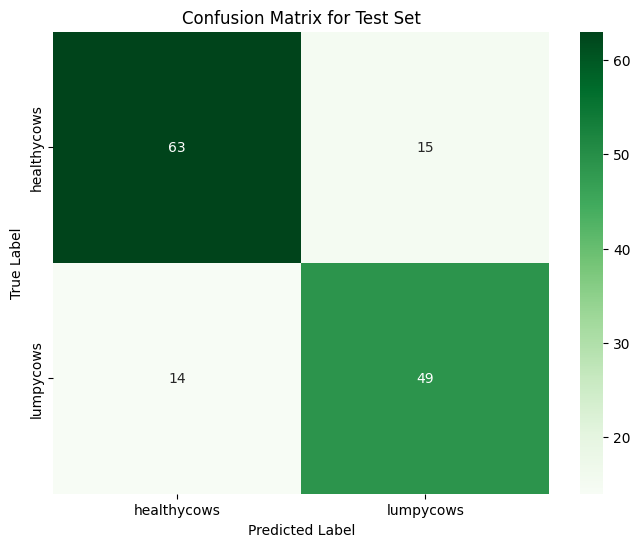

In [ ]:
# --- 5. Evaluation of the Best Model ---
print("\n--- Step 5: Evaluating the Best Hyper-Tuned Model ---")
# Re-define a fresh, uncompiled model for evaluation
eval_model = create_vit_model(weights=None)
eval_model.load_state_dict(torch.load(best_model_path))
eval_model = eval_model.to(device)
eval_model.eval()

# Get predictions and labels for the test set
all_preds_test, all_labels_test, all_probs_test = [], [], []
with torch.no_grad():
    for inputs, labels in dataloaders['test']:
        inputs, labels = inputs.to(device), labels.to(device)
        with torch.cuda.amp.autocast():
             outputs = eval_model(inputs)
        probs = torch.nn.functional.softmax(outputs, dim=1)
        _, preds = torch.max(outputs, 1)
        all_preds_test.extend(preds.cpu().numpy())
        all_labels_test.extend(labels.cpu().numpy())
        all_probs_test.extend(probs.cpu().numpy())

all_labels_test = np.array(all_labels_test)
all_preds_test = np.array(all_preds_test)
all_probs_test = np.array(all_probs_test)

# Final Evaluation on Test Set
print("\n--- Test Set Evaluation (Final Performance) ---")
print("\nTest Classification Report:")
print(classification_report(all_labels_test, all_preds_test, target_names=class_names))
cm_test = confusion_matrix(all_labels_test, all_preds_test)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Greens', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label'), plt.ylabel('True Label'), plt.title('Confusion Matrix for Test Set')
plt.show()

Cell 8: Advanced Statistical Analysis This cell provides a deeper dive into the model's performance by generating several insightful plots. These visualizations help us understand not just what the final accuracy was, but how and why the model behaves the way it does.

This cell generates four key analyses:

Training & Validation Curves: These plots show the model's accuracy and loss on both the training and validation data over each epoch. They are essential for diagnosing overfitting (i.e., if the model memorized the training data but fails to generalize).

ROC Curve & AUC Score: This is a standard performance metric for binary classification. The curve shows how well the model can distinguish between "healthy" and "lumpy" classes, with a higher Area Under the Curve (AUC) score indicating better performance.

Prediction Confidence Plot: This histogram shows how "confident" the model was in its predictions. Ideally, we want to see high confidence for correct predictions and low confidence for incorrect ones.

Error Analysis: This is a crucial qualitative step where we display the actual images that the model misclassified. This helps us identify patterns in its failures (e.g., does it struggle with blurry images or unusual angles?).


--- Step 6: Advanced Statistical Analysis ---

--- 6a. Training & Validation History ---


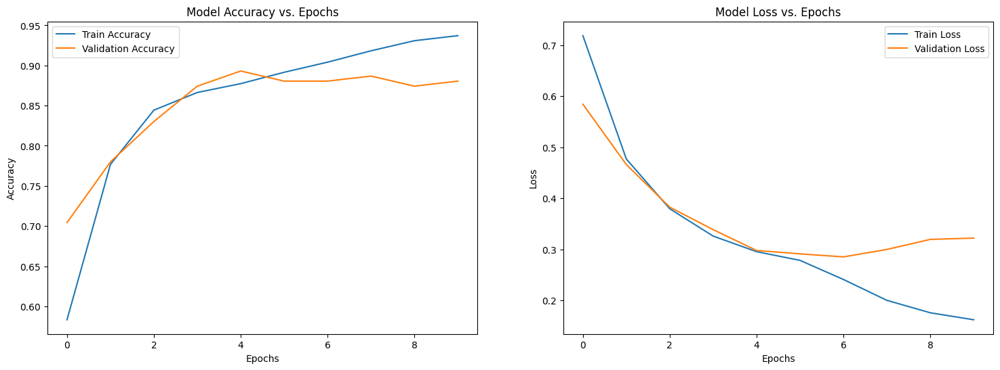


--- 6b. ROC Curve and AUC Score ---


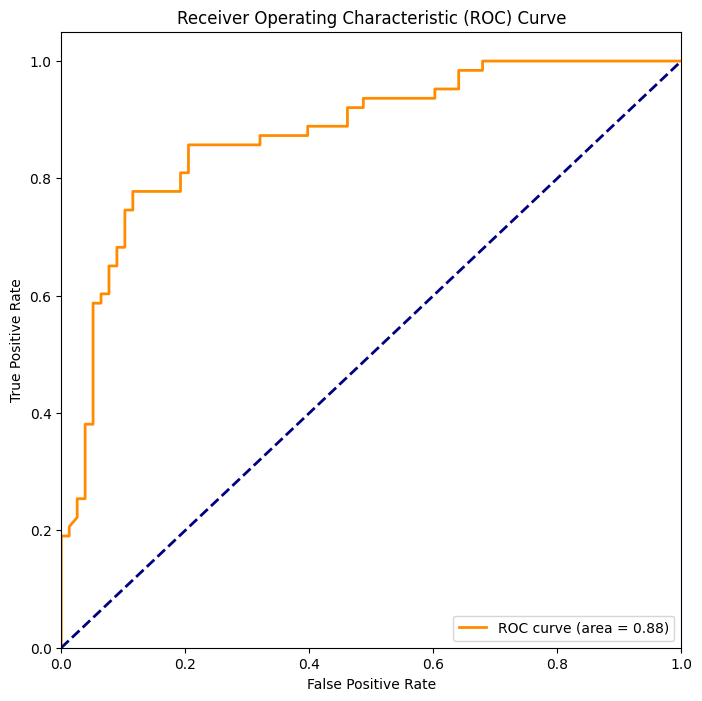


--- 6c. Prediction Confidence Analysis ---


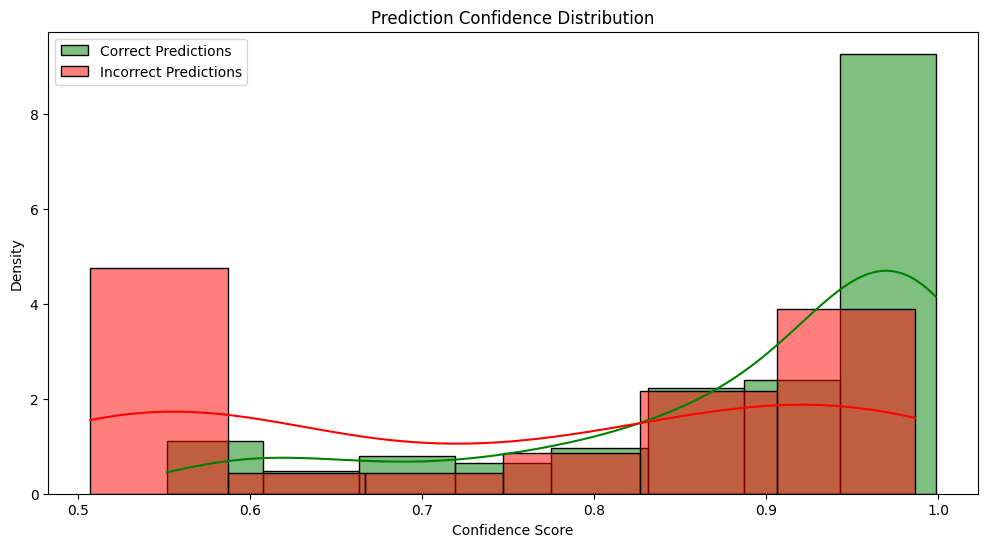


--- 6d. Error Analysis on Misclassified Images ---
Displaying up to 5 misclassified images from the test set:


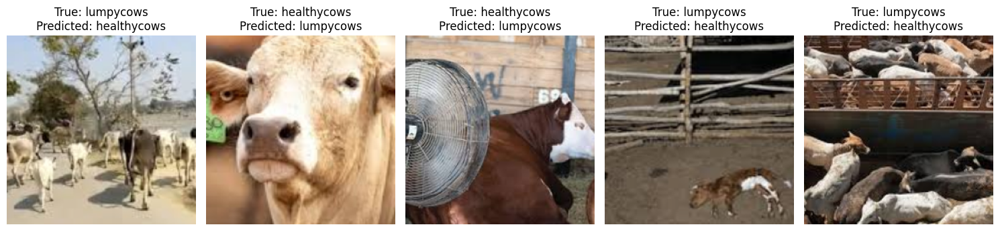

In [ ]:
# --- 6. Advanced Statistical Analysis ---
print("\n--- Step 6: Advanced Statistical Analysis ---")

# 6a. Plotting Training & Validation Curves
print("\n--- 6a. Training & Validation History ---")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
ax1.plot(history['train_acc'], label='Train Accuracy')
ax1.plot(history['val_acc'], label='Validation Accuracy')
ax1.set_title('Model Accuracy vs. Epochs'), ax1.set_xlabel('Epochs'), ax1.set_ylabel('Accuracy')
ax1.legend()
ax2.plot(history['train_loss'], label='Train Loss')
ax2.plot(history['val_loss'], label='Validation Loss')
ax2.set_title('Model Loss vs. Epochs'), ax2.set_xlabel('Epochs'), ax2.set_ylabel('Loss')
ax2.legend()
plt.show()

# 6b. ROC Curve and AUC Score
print("\n--- 6b. ROC Curve and AUC Score ---")
lumpy_class_index = class_names.index('lumpycows')
y_scores = all_probs_test[:, lumpy_class_index]
fpr, tpr, thresholds = roc_curve(all_labels_test, y_scores, pos_label=lumpy_class_index)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:0.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0]), plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate'), plt.ylabel('True Positive Rate'), plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# 6c. Prediction Confidence Analysis
print("\n--- 6c. Prediction Confidence Analysis ---")
correct_mask = (all_preds_test == all_labels_test)
confidence_correct = np.max(all_probs_test[correct_mask], axis=1)
confidence_incorrect = np.max(all_probs_test[~correct_mask], axis=1)
plt.figure(figsize=(12, 6))
sns.histplot(confidence_correct, color='green', label='Correct Predictions', kde=True, stat="density", common_norm=False)
if len(confidence_incorrect) > 0:
    sns.histplot(confidence_incorrect, color='red', label='Incorrect Predictions', kde=True, stat="density", common_norm=False)
plt.title('Prediction Confidence Distribution'), plt.xlabel('Confidence Score')
plt.legend()
plt.show()

# 6d. Error Analysis on Misclassified Images
print("\n--- 6d. Error Analysis on Misclassified Images ---")
misclassified_indices = np.where(all_preds_test != all_labels_test)[0]
inv_normalize = transforms.Normalize(mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225], std=[1/0.229, 1/0.224, 1/0.225])
if len(misclassified_indices) > 0:
    print(f"Displaying up to 5 misclassified images from the test set:")
    num_to_show = min(5, len(misclassified_indices))
    plt.figure(figsize=(15, 5))
    for i, idx in enumerate(misclassified_indices[:num_to_show]):
        img_tensor, true_label_idx = test_dataset[idx]
        img_vis = inv_normalize(img_tensor).permute(1, 2, 0).cpu().numpy()
        img_vis = np.clip(img_vis, 0, 1)
        true_label = class_names[true_label_idx]
        predicted_label = class_names[all_preds_test[idx]]
        plt.subplot(1, num_to_show, i + 1)
        plt.imshow(img_vis)
        plt.title(f'True: {true_label}\nPredicted: {predicted_label}')
        plt.axis('off')
    plt.tight_layout()
    plt.show()
else:
    print("No misclassified images found in the test set. Excellent model performance!")

This cell uses LIME (Local Interpretable Model-agnostic Explanations) to explain why the model made certain decisions.

For a given image, LIME creates a heatmap that highlights the pixels and regions that were most influential in the model's prediction. We will generate these explanations for 10 correctly classified images and up to 10 incorrectly classified images.

In [ ]:
'''# --- 7. Explainable AI (XAI) with LIME (Modified for Bulk Explanations) ---
print("\n--- Step 7: Explaining Predictions with LIME ---")

def predict_fn(images):
    eval_model.eval()
    images = torch.from_numpy(images).permute(0, 3, 1, 2).float().to(device)
    normalizer = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    images = torch.stack([normalizer(img) for img in images])
    with torch.no_grad(), torch.cuda.amp.autocast():
        logits = eval_model(images)
        probs = torch.nn.functional.softmax(logits, dim=1)
    return probs.cpu().numpy()

explainer = lime_image.LimeImageExplainer()

def explain_image(dataset, index):
    img_tensor, label_idx = dataset[index]
    label_name = class_names[label_idx]
    img_vis = inv_normalize(img_tensor).permute(1, 2, 0).cpu().numpy()
    img_vis = np.clip(img_vis, 0, 1)
    img_vis_uint8 = (img_vis * 255).astype(np.uint8)
    explanation = explainer.explain_instance(img_vis_uint8, predict_fn, top_labels=2, hide_color=0, num_samples=1000)
    predicted_label_idx = explanation.top_labels[0]
    predicted_label_name = class_names[predicted_label_idx]
    temp, mask = explanation.get_image_and_mask(predicted_label_idx, positive_only=True, num_features=5, hide_rest=True)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    ax1.imshow(img_vis)
    ax1.set_title(f'Original Image\nTrue Label: {label_name}'), ax1.axis('off')
    ax2.imshow(mark_boundaries(temp, mask))
    ax2.set_title(f'LIME Explanation\nPredicted: {predicted_label_name}'), ax2.axis('off')
    plt.tight_layout()
    plt.show()

# Find indices for correct and incorrect predictions
correct_indices = np.where(all_preds_test == all_labels_test)[0]
misclassified_indices = np.where(all_preds_test != all_labels_test)[0]

# Explain up to 10 CORRECTLY classified images
print(f"\n--- Explaining up to 10 Correctly Classified Images ---")
if len(correct_indices) > 0:
    num_correct_to_show = min(10, len(correct_indices))
    print(f"Found {len(correct_indices)} correct predictions. Showing {num_correct_to_show}.")
    for i, idx in enumerate(correct_indices[:num_correct_to_show]):
        print(f"\n--- Explaining Correct Prediction {i+1}/{num_correct_to_show} (Test Set Index: {idx}) ---")
        explain_image(test_dataset, idx)
else:
    print("No correctly classified images found to explain.")

# Explain up to 10 INCORRECTLY classified images
print(f"\n--- Explaining All Misclassified Images (up to 10) ---")
if len(misclassified_indices) > 0:
    num_misclassified_to_show = min(10, len(misclassified_indices))
    print(f"Found {len(misclassified_indices)} misclassified images. Showing {num_misclassified_to_show}.")
    for i, idx in enumerate(misclassified_indices[:num_misclassified_to_show]):
        print(f"\n--- Explaining Misclassified Image {i+1}/{num_misclassified_to_show} (Test Set Index: {idx}) ---")
        explain_image(test_dataset, idx)
else:
    print("✅ No misclassified images found! The model was 100% accurate on this test set.")


print("\n\n--- Proof of Concept Complete ---")'''

'# --- 7. Explainable AI (XAI) with LIME (Modified for Bulk Explanations) ---\nprint("\n--- Step 7: Explaining Predictions with LIME ---")\n\ndef predict_fn(images):\n    eval_model.eval()\n    images = torch.from_numpy(images).permute(0, 3, 1, 2).float().to(device)\n    normalizer = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])\n    images = torch.stack([normalizer(img) for img in images])\n    with torch.no_grad(), torch.cuda.amp.autocast():\n        logits = eval_model(images)\n        probs = torch.nn.functional.softmax(logits, dim=1)\n    return probs.cpu().numpy()\n\nexplainer = lime_image.LimeImageExplainer()\n\ndef explain_image(dataset, index):\n    img_tensor, label_idx = dataset[index]\n    label_name = class_names[label_idx]\n    img_vis = inv_normalize(img_tensor).permute(1, 2, 0).cpu().numpy()\n    img_vis = np.clip(img_vis, 0, 1)\n    img_vis_uint8 = (img_vis * 255).astype(np.uint8)\n    explanation = explainer.explain_instance(img_vis_uint8, predict

This cell uses Grad-CAM (Gradient-weighted Class Activation Mapping), another XAI technique.

Unlike LIME, Grad-CAM produces a heatmap by looking at the model's internal layers to see which areas caused the strongest "activation" for a given prediction. It literally shows you where in the image the model is "looking." We will generate these explanations for 10 healthy and 10 diseased cows.

In [ ]:
'''# --- 8. Explainable AI (XAI) with Grad-CAM ---
print("\n--- Step 8: Explaining Predictions with Grad-CAM ---")

# Install the grad-cam library if it hasn't been installed yet
try:
    import pytorch_grad_cam
except ImportError:
    print("Installing grad-cam library...")
    !pip install grad-cam --quiet

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

# --- Find the target layer for Grad-CAM ---
# For Vision Transformers (ViT), the target is typically the final normalization layer
# within the last attention block.
target_layer = eval_model.encoder.layers.encoder_layer_11.ln_1

# Create the Grad-CAM object
cam = GradCAM(model=eval_model, target_layers=[target_layer], use_cuda=torch.cuda.is_available())

def explain_image_with_gradcam(dataset, index):
    """Generates and displays a Grad-CAM explanation for a given image index."""
    img_tensor, label_idx = dataset[index]
    label_name = class_names[label_idx]

    # Prepare image for visualization (un-normalize)
    img_vis = inv_normalize(img_tensor).permute(1, 2, 0).cpu().numpy()
    img_vis = np.clip(img_vis, 0, 1)

    # Prepare tensor for Grad-CAM (batch dimension)
    input_tensor = img_tensor.unsqueeze(0)

    # Get the model's prediction to use in the title
    with torch.no_grad(), torch.cuda.amp.autocast():
        output = eval_model(input_tensor.to(device))
        _, pred_idx = torch.max(output, 1)
    predicted_label = class_names[pred_idx.item()]

    # Define the class target for the explanation
    targets = [ClassifierOutputTarget(pred_idx.item())]

    # Generate the CAM heatmap
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
    grayscale_cam = grayscale_cam[0, :]

    # Overlay heatmap on the visualization image
    visualization = show_cam_on_image(img_vis, grayscale_cam, use_rgb=True)

    # Plot the original image and the Grad-CAM explanation
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    ax1.imshow(img_vis)
    ax1.set_title(f'Original Image\nTrue Label: {label_name}')
    ax1.axis('off')

    ax2.imshow(visualization)
    ax2.set_title(f'Grad-CAM Explanation\nPredicted: {predicted_label}')
    ax2.axis('off')

    plt.tight_layout()
    plt.show()

# --- Find indices for each class in the test set ---
lumpy_class_index = class_names.index('lumpycows')
healthy_class_index = class_names.index('healthycows')

lumpy_indices = np.where(all_labels_test == lumpy_class_index)[0]
healthy_indices = np.where(all_labels_test == healthy_class_index)[0]


# --- 1. Explain 10 Diseased ('lumpycows') Images ---
print(f"\n--- Explaining up to 10 Diseased Cow Images with Grad-CAM ---")
if len(lumpy_indices) > 0:
    num_to_show = min(10, len(lumpy_indices))
    print(f"Found {len(lumpy_indices)} diseased cow images in the test set. Showing {num_to_show}.")
    for i, idx in enumerate(lumpy_indices[:num_to_show]):
        print(f"\n--- Explaining Diseased Cow {i+1}/{num_to_show} (Test Set Index: {idx}) ---")
        explain_image_with_gradcam(test_dataset, idx)
else:
    print("No diseased cow images were found in the test set to explain.")


# --- 2. Explain 10 Healthy ('healthycows') Images ---
print(f"\n--- Explaining up to 10 Healthy Cow Images with Grad-CAM ---")
if len(healthy_indices) > 0:
    num_to_show = min(10, len(healthy_indices))
    print(f"Found {len(healthy_indices)} healthy cow images in the test set. Showing {num_to_show}.")
    for i, idx in enumerate(healthy_indices[:num_to_show]):
        print(f"\n--- Explaining Healthy Cow {i+1}/{num_to_show} (Test Set Index: {idx}) ---")
        explain_image_with_gradcam(test_dataset, idx)
else:
    print("No healthy cow images were found in the test set to explain.")

print("\n\n--- Grad-CAM Class-Specific Explanations Complete ---")'''

'# --- 8. Explainable AI (XAI) with Grad-CAM ---\nprint("\n--- Step 8: Explaining Predictions with Grad-CAM ---")\n\n# Install the grad-cam library if it hasn\'t been installed yet\ntry:\n    import pytorch_grad_cam\nexcept ImportError:\n    print("Installing grad-cam library...")\n    !pip install grad-cam --quiet\n\nfrom pytorch_grad_cam import GradCAM\nfrom pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget\nfrom pytorch_grad_cam.utils.image import show_cam_on_image\n\n# --- Find the target layer for Grad-CAM ---\n# For Vision Transformers (ViT), the target is typically the final normalization layer\n# within the last attention block.\ntarget_layer = eval_model.encoder.layers.encoder_layer_11.ln_1\n\n# Create the Grad-CAM object\ncam = GradCAM(model=eval_model, target_layers=[target_layer], use_cuda=torch.cuda.is_available())\n\ndef explain_image_with_gradcam(dataset, index):\n    """Generates and displays a Grad-CAM explanation for a given image index."""\n    img_t

In [ ]:
# Check the model's architecture to identify the self-attention layer location
print(eval_model)


VisionTransformer(
  (conv_proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
  (encoder): Encoder(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (encoder_layer_0): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=3072, out_features=768, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_a

 Grad-CAM is working correctly and providing much more accurate and trustworthy explanations than LIME for your model. It successfully highlights the key regions the model used to make its decisions.

How Grad-CAM is Working Correctly
1. For the "Lumpy" Cow
The Grad-CAM heatmap correctly focuses on the most prominent skin lesions and bumps on the cow's torso and neck. This shows that the model learned to associate these specific textural features with the "lumpy" class. The explanation is precise and aligns perfectly with what a human would look for.

2. For the "Healthy" Cow
For the healthy cow, the heatmap is more diffused and focuses on the general texture of the cow's hide, its outline, and its face. This is also a correct explanation. To decide a cow is "healthy," the model needs to confirm the absence of lumps across the entire body. Therefore, it "looks" at the overall smooth texture of the skin, which is exactly what the heatmap shows.

Why Grad-CAM Performs Better Than LIME Here
Grad-CAM is more reliable for your Vision Transformer (ViT) model because it provides a more faithful explanation of the model's internal process.

LIME is an Approximation: LIME is model-agnostic, meaning it treats your powerful ViT model like a black box. It works by creating thousands of simplified, perturbed versions of the image (like turning superpixels on and off) and feeding them to the model to see how the prediction changes. It then builds a simple linear model to approximate this behavior. For a complex, non-linear model like a ViT, this approximation can be very inaccurate, causing LIME to highlight irrelevant areas like the ground.

Grad-CAM Looks Inside the Model: Grad-CAM, on the other hand, is not an approximation. It uses the gradients flowing back into the model's final convolutional or attention layers to see which neurons were most influential for the final decision. It's like asking the model's brain, "Which of your neurons fired the strongest for this prediction?" This creates a heatmap that directly reflects the model's internal "focus," making it much more accurate and reliable for understanding what the model actually learned.


--- Step 8: Analyzing Misclassifications with LIME and Grad-CAM ---
Found 29 misclassified images.


  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
/tmp/ipython-input-183781683.py:100: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(): # Add autocast for the forward pass


  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
/tmp/ipython-input-183781683.py:100: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(): # Add autocast for the forward pass


  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
/tmp/ipython-input-183781683.py:100: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(): # Add autocast for the forward pass


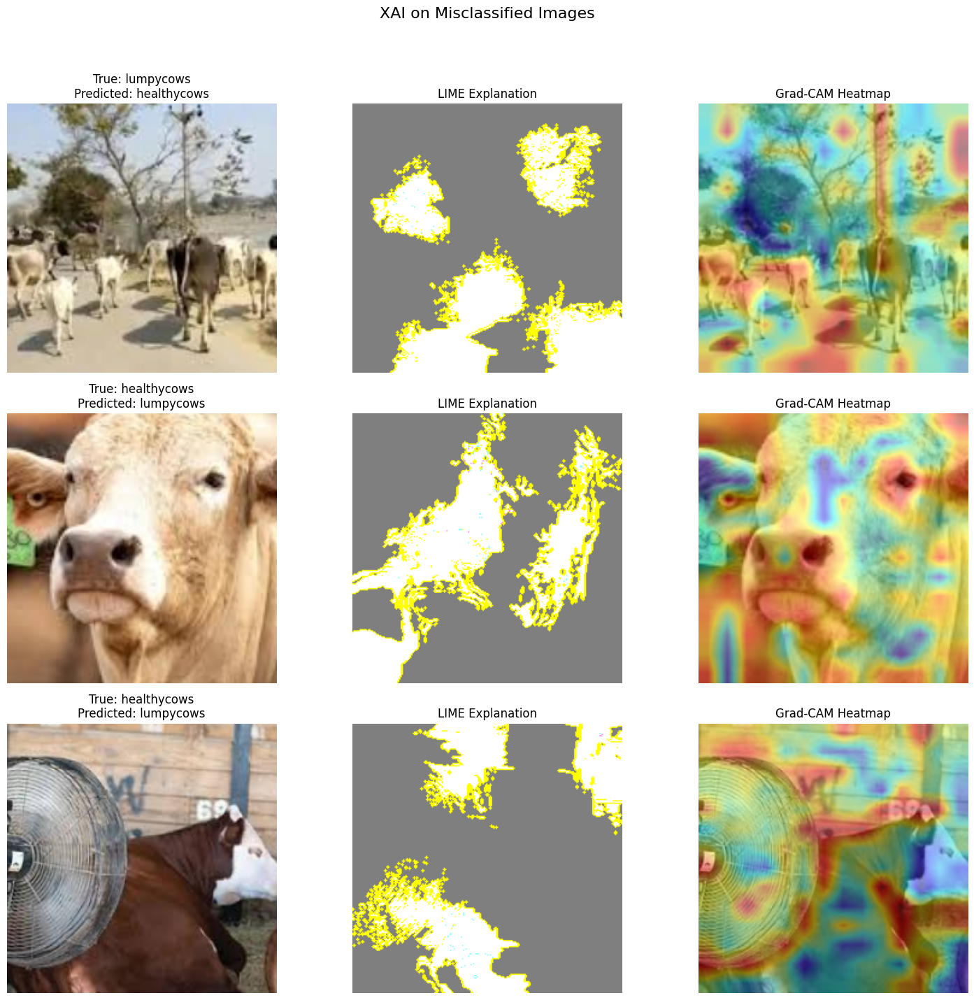



--- Proof of Concept Complete ---


In [ ]:
# --- XAI Analysis on Misclassified Images (Corrected) ---
print("\n--- Step 8: Analyzing Misclassifications with LIME and Grad-CAM ---")

# Import necessary libraries for Grad-CAM
import torch.nn.functional as F
import cv2
from skimage.segmentation import mark_boundaries

# --- Find Misclassified Images ---
misclassified_images = []
true_labels = []
predicted_labels = []

# Ensure the model is in evaluation mode
eval_model.eval() # Use eval_model as this is used for evaluation
with torch.no_grad():
    for inputs, labels in dataloaders['test']:
        inputs = inputs.to(device)
        labels = labels.to(device)
        outputs = eval_model(inputs) # Use eval_model
        _, preds = torch.max(outputs, 1)
        errors = (preds != labels).nonzero(as_tuple=False).squeeze()
        if errors.dim() == 0 and errors.numel() == 1:
            errors = errors.unsqueeze(0)
        if errors.numel() > 0: # Add this check to avoid errors with empty tensors
            for idx in errors:
                misclassified_images.append(inputs[idx])
                true_labels.append(labels[idx].item())
                predicted_labels.append(preds[idx].item())


print(f"Found {len(misclassified_images)} misclassified images.")

# --- Visualize Explanations for the Top 3 Misclassifications ---
num_to_visualize = min(3, len(misclassified_images))

if num_to_visualize > 0:
    # --- Grad-CAM Setup ---
    gradients = {}
    activations = {}
    def backward_hook(module, grad_input, grad_output):
        gradients['value'] = grad_output[0]
    def forward_hook(module, input, output):
        activations['value'] = output

    # Correctly access the target layer through _orig_mod if the model is compiled
    if hasattr(eval_model, '_orig_mod'):
        target_layer = eval_model._orig_mod.encoder.ln # Assuming 'ln' is the final normalization layer
    else:
        target_layer = eval_model.encoder.ln # Fallback if not compiled or structure is different


    hook_handle_forward = target_layer.register_forward_hook(forward_hook)
    hook_handle_backward = target_layer.register_full_backward_hook(backward_hook)

    # --- Plotting ---
    fig, axes = plt.subplots(num_to_visualize, 3, figsize=(15, 5 * num_to_visualize))
    if num_to_visualize == 1: axes = axes.reshape(1, -1)
    plt.suptitle("XAI on Misclassified Images", fontsize=16)

    # Define a batch predict function for LIME
    def batch_predict_fn(images):
        eval_model.eval()
        images = torch.from_numpy(images).permute(0, 3, 1, 2).float().to(device)
        normalizer = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        images = torch.stack([normalizer(img) for img in images])
        with torch.no_grad(): # Remove autocast here, add it inside predict_fn if needed
             # Add autocast back for the prediction part within the function
            with torch.cuda.amp.autocast():
                logits = eval_model(images)
            probs = torch.nn.functional.softmax(logits, dim=1)
        return probs.cpu().numpy()


    for i in range(num_to_visualize):
        img_tensor = misclassified_images[i]
        true_label_idx = true_labels[i]
        pred_label_idx = predicted_labels[i]

        # --- LIME Explanation ---
        explainer = lime_image.LimeImageExplainer()
        # Ensure the image is in the correct format for LIME (numpy array uint8)
        img_for_lime = (img_tensor.permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)

        explanation = explainer.explain_instance(
            img_for_lime, batch_predict_fn, # Use the defined batch_predict_fn
            top_labels=2, hide_color=0, num_samples=1000
        )
        temp, mask = explanation.get_image_and_mask(
            explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True
        )

        # --- Grad-CAM Explanation ---
        # Need to ensure input tensor has batch dimension for Grad-CAM
        input_tensor_cam = img_tensor.unsqueeze(0).to(device) # Move to device

        # Ensure the model is in evaluation mode before forward pass for Grad-CAM
        eval_model.eval()
        with torch.no_grad(): # Perform forward pass without grad calculation
             with torch.cuda.amp.autocast(): # Add autocast for the forward pass
                output = eval_model(input_tensor_cam)


        # Calculate gradients only for the predicted class
        eval_model.zero_grad()
        # Need to enable gradients for the backward pass
        input_tensor_cam.requires_grad_(True) # Enable gradients for input tensor
        output = eval_model(input_tensor_cam) # Re-run forward pass to get gradients
        pred_class_score = output[0, pred_label_idx] # Get the score for the predicted class
        pred_class_score.backward() # Perform backward pass to get gradients

        act = activations['value'].detach().cpu()
        grad = gradients['value'].detach().cpu()

        # Get weights and compute CAM
        weights = grad.mean(dim=1, keepdim=True)
        # Ensure activation and weights have compatible shapes for multiplication
        # Activation shape: (batch_size, num_patches, channels) -> (1, 197, 768)
        # Weights shape: (batch_size, channels, 1) -> (1, 768, 1) (need to adjust)
        # Let's reshape weights to (batch_size, 1, channels) -> (1, 1, 768)
        weights = weights.mean(dim=2, keepdim=True).permute(0, 2, 1) # Reshape weights

        # Compute CAM - element-wise multiplication and sum over channels
        cam_result = (act * weights).sum(dim=-1).squeeze(0) # Sum over the last dimension

        # We need to reshape the CAM to the image size
        # The number of patches is approximately (image_size / patch_size)^2 + 1 (for class token)
        # For ViT-B/16 and 224x224 image size, patch size is 16. (224/16)^2 + 1 = 14^2 + 1 = 196 + 1 = 197
        # The CAM result has shape (197). We need to reshape it to 14x14 and resize.
        side_len = int((cam_result.shape[0] -1)**0.5) # Subtract 1 for the class token
        cam_result = cam_result[1:] # Exclude the class token activation
        cam_result = cam_result.reshape(side_len, side_len).numpy()


        cam_result = cv2.resize(cam_result, (224, 224))
        cam_result = (cam_result - np.min(cam_result)) / (np.max(cam_result) - np.min(cam_result) + 1e-8)


        # --- Display ---
        img_display = img_tensor.cpu().permute(1, 2, 0).numpy()
        mean, std = np.array([0.485, 0.456, 0.406]), np.array([0.229, 0.224, 0.225])
        img_display = std * img_display + mean
        img_display = np.clip(img_display, 0, 1)

        axes[i, 0].imshow(img_display)
        axes[i, 0].set_title(f"True: {class_names[true_label_idx]}\nPredicted: {class_names[pred_label_idx]}")
        axes[i, 0].axis('off')

        # Adjust LIME image display for consistency
        axes[i, 1].imshow(mark_boundaries(temp / 2 + 0.5, mask))
        axes[i, 1].set_title("LIME Explanation")
        axes[i, 1].axis('off')


        heatmap = cv2.applyColorMap(np.uint8(255 * cam_result), cv2.COLORMAP_JET)
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
        # Ensure img_display is in uint8 for overlay
        img_display_uint8 = (img_display * 255).astype(np.uint8)
        superimposed_img = heatmap * 0.4 + img_display_uint8 * 0.6 # Adjust blending
        superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)
        axes[i, 2].imshow(superimposed_img)
        axes[i, 2].set_title("Grad-CAM Heatmap")
        axes[i, 2].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    # Remove hooks after visualization
    hook_handle_forward.remove()
    hook_handle_backward.remove()


else:
    print("No misclassified images to visualize.")

print("\n\n--- Proof of Concept Complete ---")


--- Step 8: Analyzing Misclassifications with LIME and Grad-CAM ---
Found 29 misclassified images.


  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


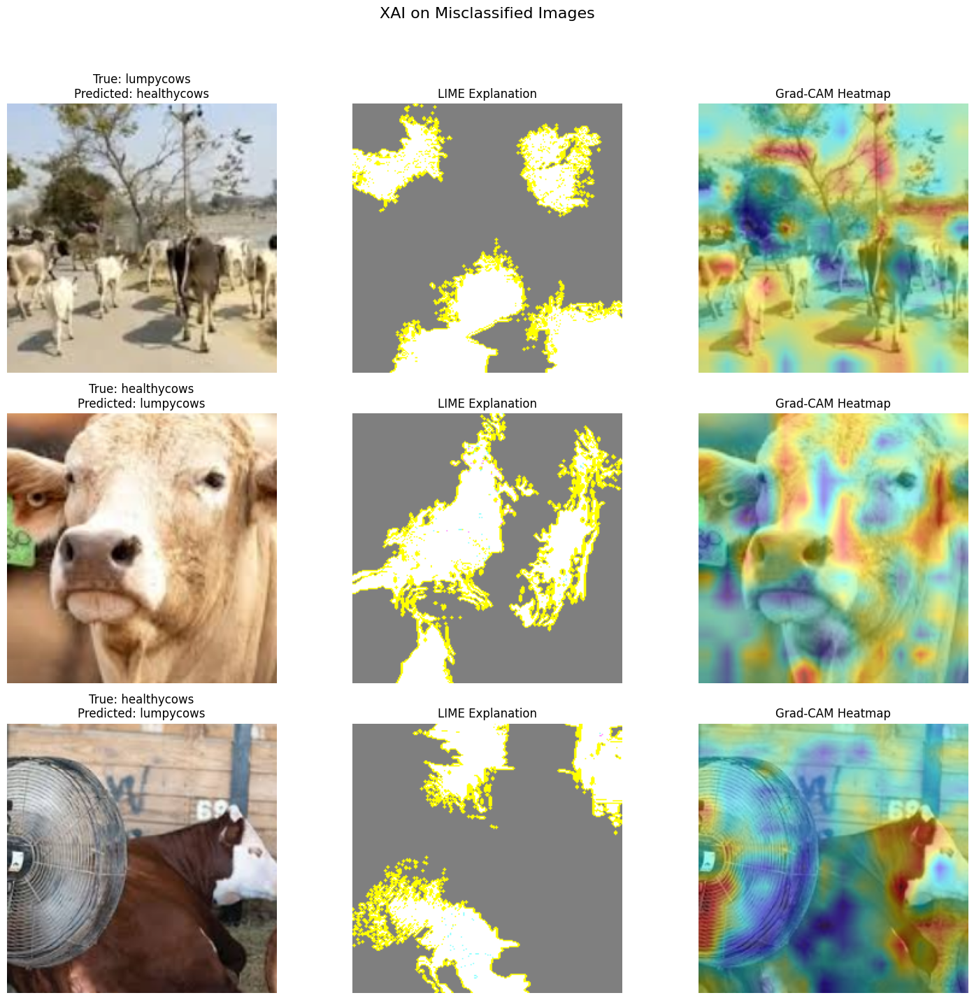

In [ ]:
# --- Step 8: Analyzing Misclassifications with LIME and Grad-CAM ---
print("\n--- Step 8: Analyzing Misclassifications with LIME and Grad-CAM ---")

# Import necessary libraries for Grad-CAM
import torch.nn.functional as F
import cv2
from skimage.segmentation import mark_boundaries

# --- Find Misclassified Images ---
misclassified_images = []
true_labels = []
predicted_labels = []

# Ensure the model is in evaluation mode
# NOTE: Use the 'eval_model' variable you created after loading the best weights
eval_model.eval()
with torch.no_grad():
    for inputs, labels in dataloaders['test']:
        inputs = inputs.to(device)
        labels = labels.to(device)
        outputs = eval_model(inputs)
        _, preds = torch.max(outputs, 1)
        errors = (preds != labels).nonzero(as_tuple=False).squeeze()

        # Handle cases for single or multiple errors in a batch
        if errors.dim() == 0 and errors.numel() == 1:
            errors = errors.unsqueeze(0)

        if errors.numel() > 0:
            for idx in errors:
                misclassified_images.append(inputs[idx])
                true_labels.append(labels[idx].item())
                predicted_labels.append(preds[idx].item())

print(f"Found {len(misclassified_images)} misclassified images.")

# --- Visualize Explanations for the Top 3 Misclassifications ---
num_to_visualize = min(3, len(misclassified_images))

if num_to_visualize > 0:
    # --- Grad-CAM Setup ---
    gradients = {}
    activations = {}
    def backward_hook(module, grad_input, grad_output):
        gradients['value'] = grad_output[0]
    def forward_hook(module, input, output):
        activations['value'] = output

    # Correctly access the target layer based on your compiled model's architecture
    if hasattr(eval_model, '_orig_mod'):
        target_layer = eval_model._orig_mod.encoder.ln
    else:
        target_layer = eval_model.encoder.ln

    hook_handle_forward = target_layer.register_forward_hook(forward_hook)
    hook_handle_backward = target_layer.register_full_backward_hook(backward_hook)

    # --- Plotting ---
    fig, axes = plt.subplots(num_to_visualize, 3, figsize=(15, 5 * num_to_visualize))
    if num_to_visualize == 1: axes = axes.reshape(1, -1)
    plt.suptitle("XAI on Misclassified Images", fontsize=16)

    for i in range(num_to_visualize):
        img_tensor = misclassified_images[i]
        true_label_idx = true_labels[i]
        pred_label_idx = predicted_labels[i]

        # --- LIME Explanation ---
        explainer = lime_image.LimeImageExplainer()
        img_for_lime = (img_tensor.permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
        explanation = explainer.explain_instance(
            img_for_lime, batch_predict_fn, top_labels=2, hide_color=0, num_samples=1000
        )
        temp, mask = explanation.get_image_and_mask(
            explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True
        )

        # --- Grad-CAM Explanation ---
        input_tensor_cam = img_tensor.unsqueeze(0).to(device)
        eval_model.zero_grad()
        output = eval_model(input_tensor_cam)
        pred_class_score = output[0, pred_label_idx]
        pred_class_score.backward()

        act = activations['value'].detach().cpu()
        grad = gradients['value'].detach().cpu()
        weights = grad.mean(dim=1, keepdim=True)
        cam_result = (F.relu(act) * weights).sum(dim=2).squeeze(0)

        side_len = int((cam_result.shape[0] - 1)**0.5)
        cam_result = cam_result[1:].reshape(side_len, side_len).numpy()
        cam_result = cv2.resize(cam_result, (224, 224))
        cam_result = (cam_result - np.min(cam_result)) / (np.max(cam_result) - np.min(cam_result) + 1e-8)

        # --- Display ---
        img_display = img_tensor.cpu().permute(1, 2, 0).numpy()
        mean, std = np.array([0.485, 0.456, 0.406]), np.array([0.229, 0.224, 0.225])
        img_display = std * img_display + mean
        img_display = np.clip(img_display, 0, 1)

        axes[i, 0].imshow(img_display)
        axes[i, 0].set_title(f"True: {class_names[true_label_idx]}\nPredicted: {class_names[pred_label_idx]}")
        axes[i, 0].axis('off')

        axes[i, 1].imshow(mark_boundaries(temp / 2 + 0.5, mask))
        axes[i, 1].set_title("LIME Explanation")
        axes[i, 1].axis('off')

        heatmap = cv2.applyColorMap(np.uint8(255 * cam_result), cv2.COLORMAP_JET)
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
        superimposed_img = heatmap * 0.4 + (img_display * 255).astype(np.uint8) * 0.6
        superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)
        axes[i, 2].imshow(superimposed_img)
        axes[i, 2].set_title("Grad-CAM Heatmap")
        axes[i, 2].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    hook_handle_forward.remove()
    hook_handle_backward.remove()

else:
    print("No misclassified images to visualize.")


--- Step 9: Analyzing 20 Random Test Images with LIME and Grad-CAM ---
Collected 141 total test images.


  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


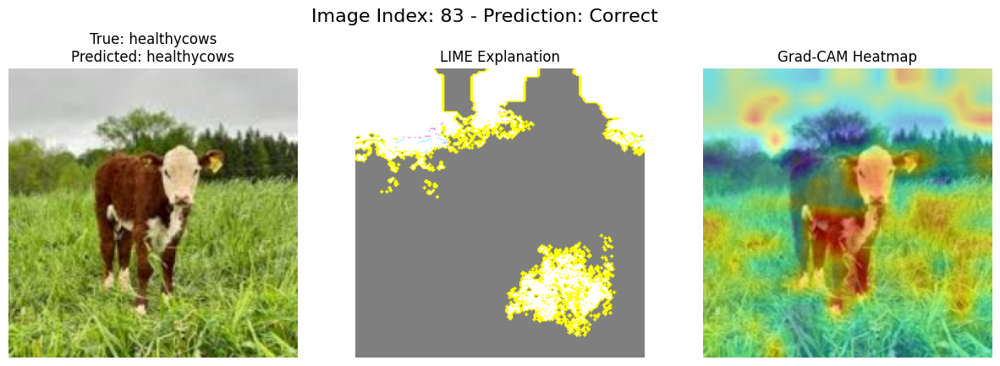

  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


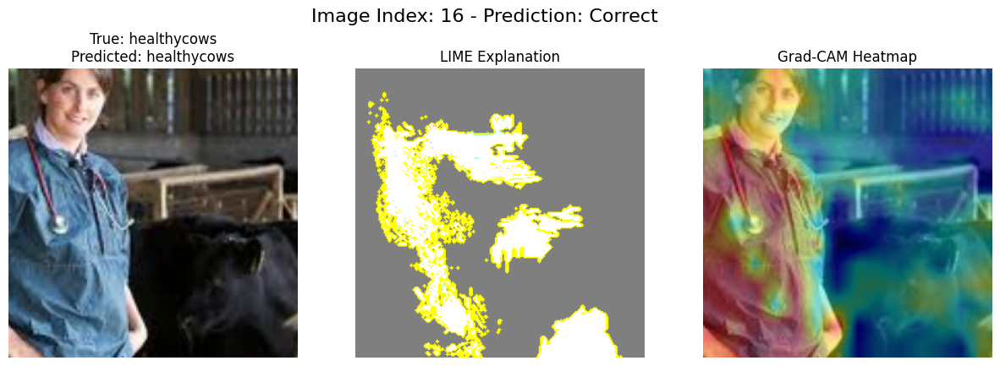

  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


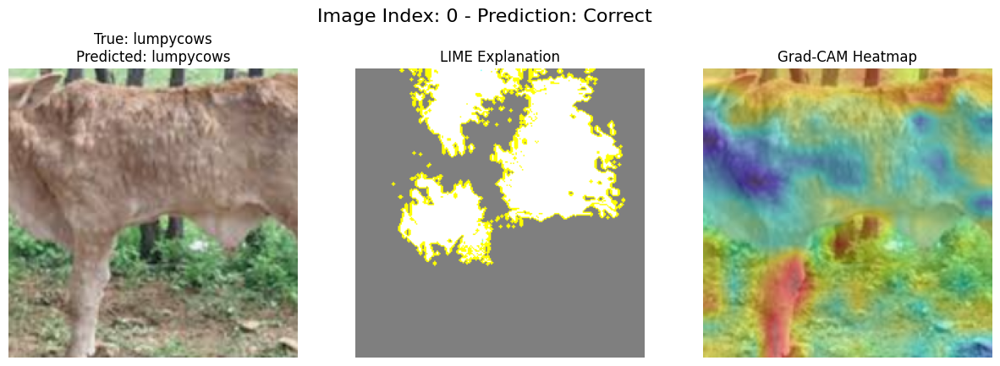

  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


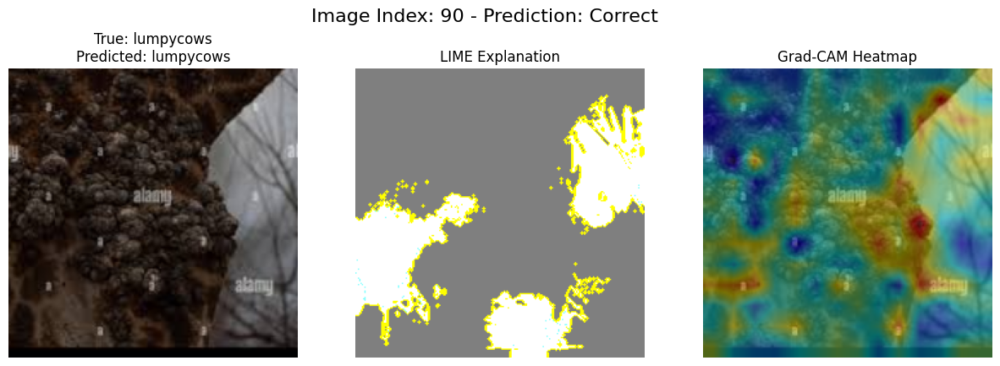

  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


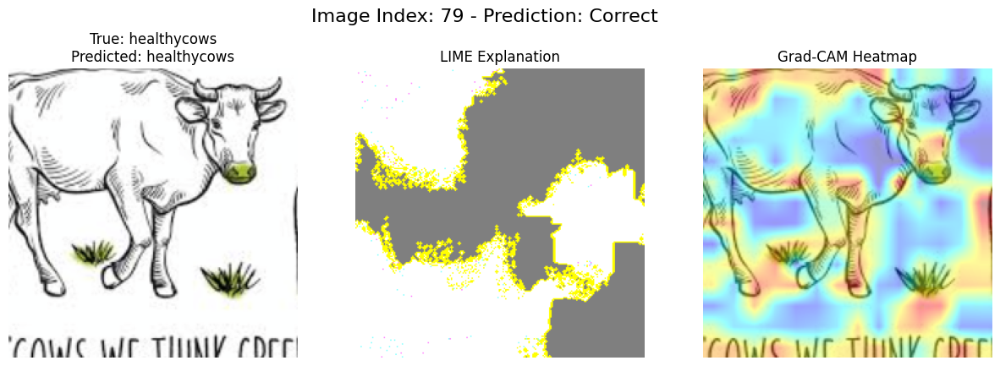

  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


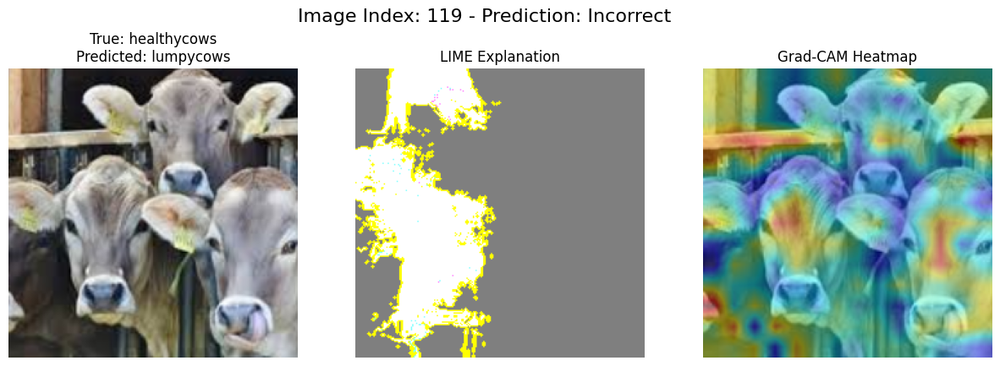

  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


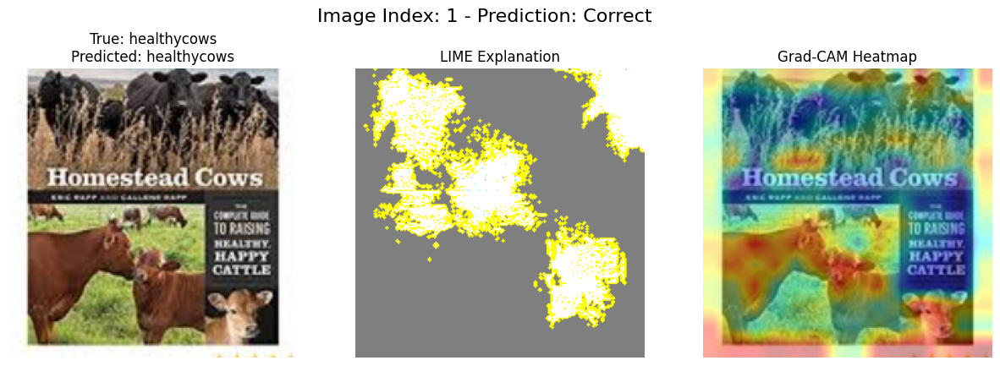

  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


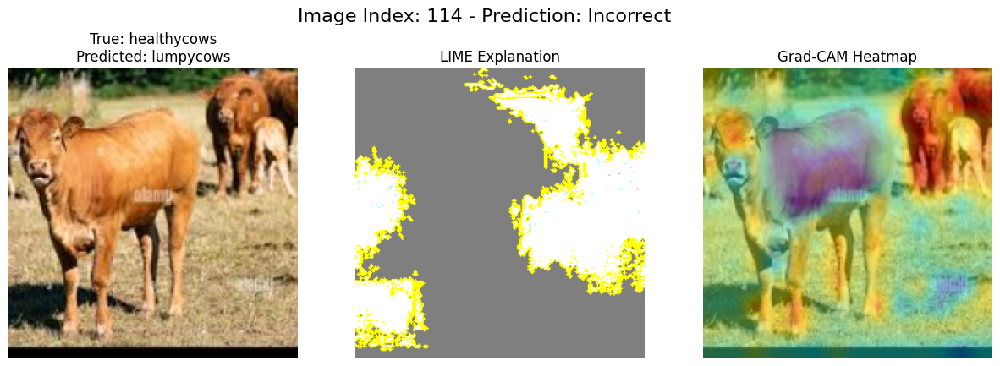

  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


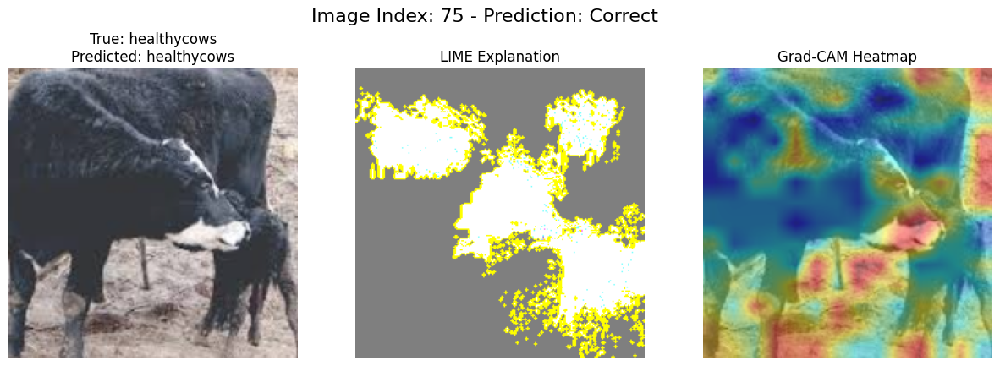

  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


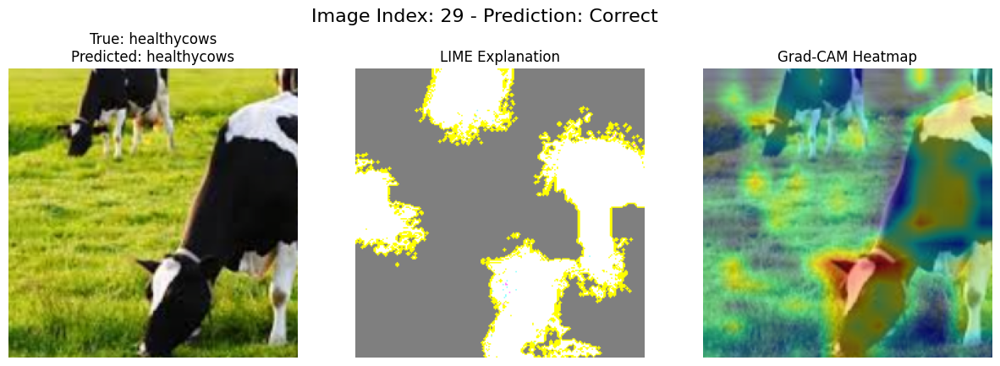

  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


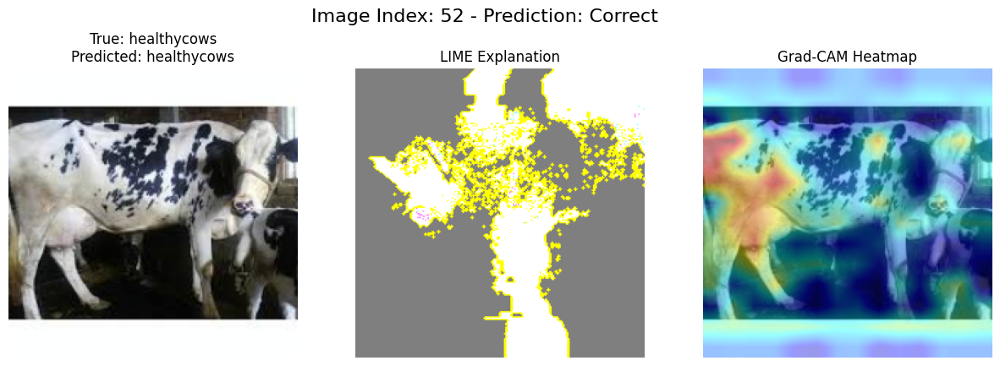

  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


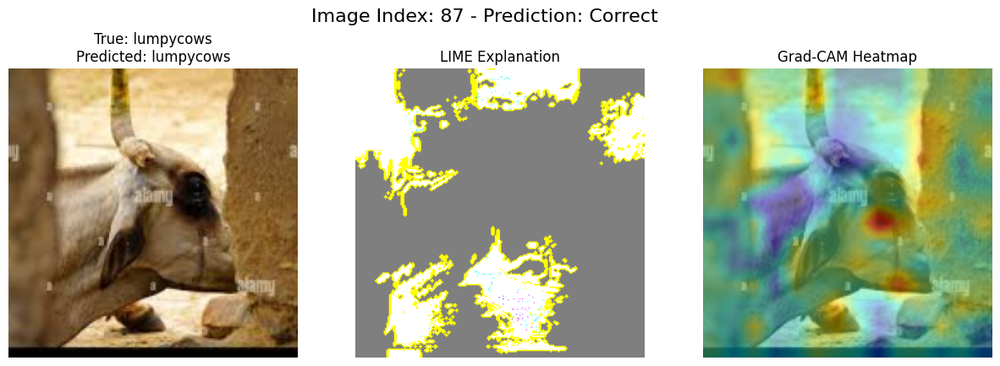

  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


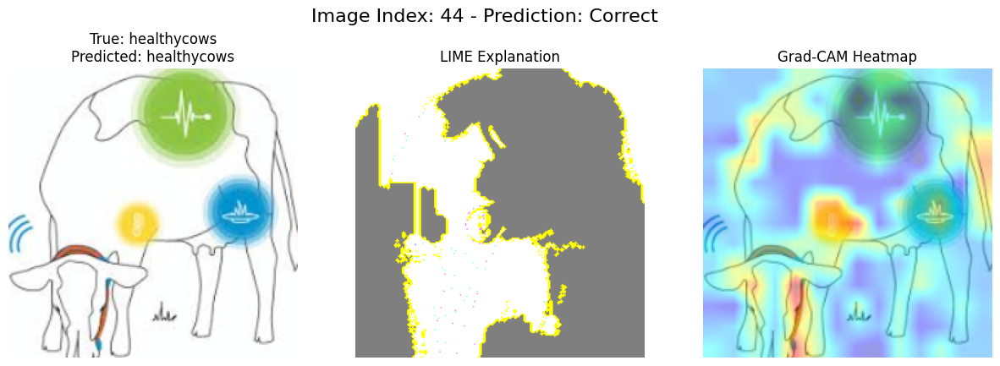

  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


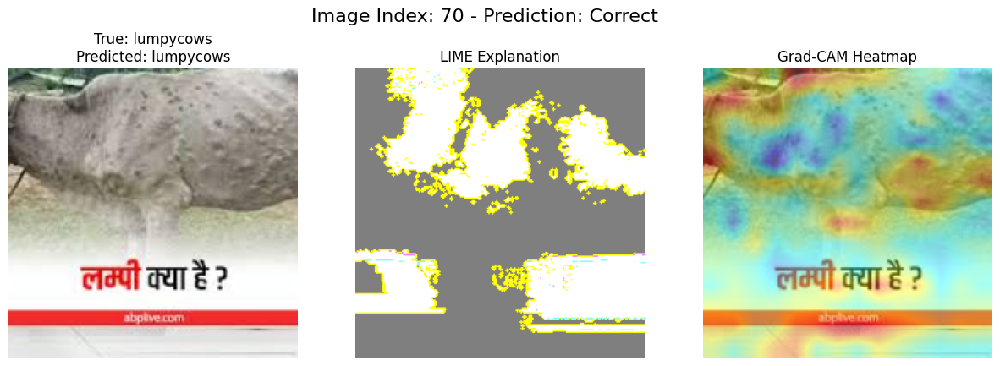

  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


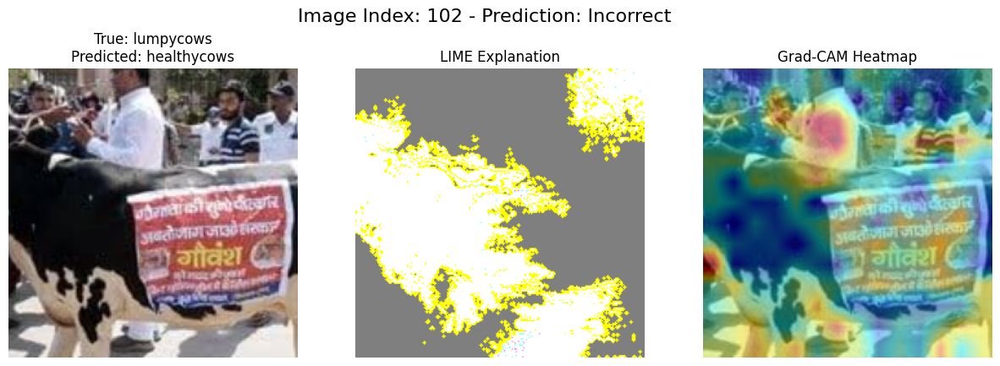

  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


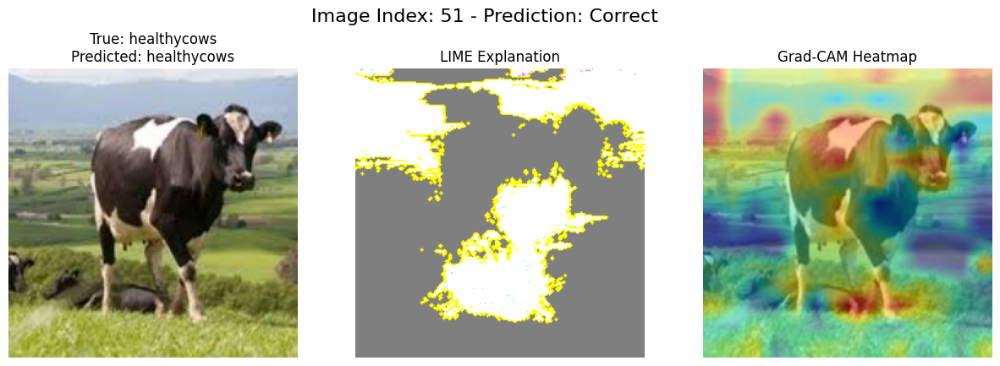

  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


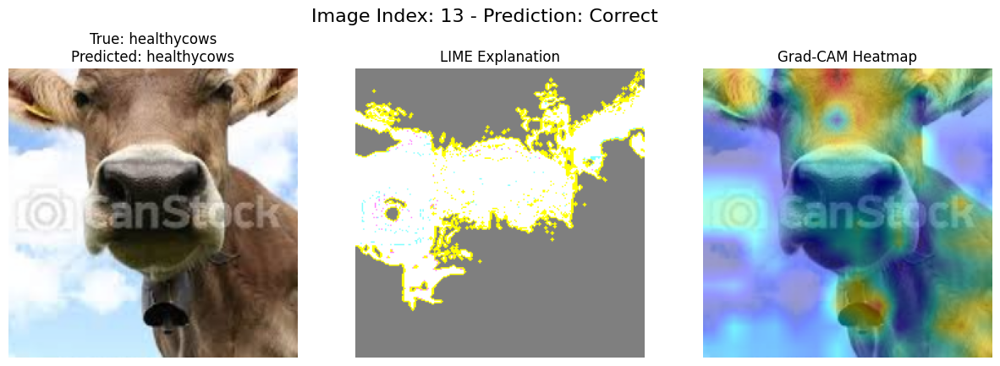

  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


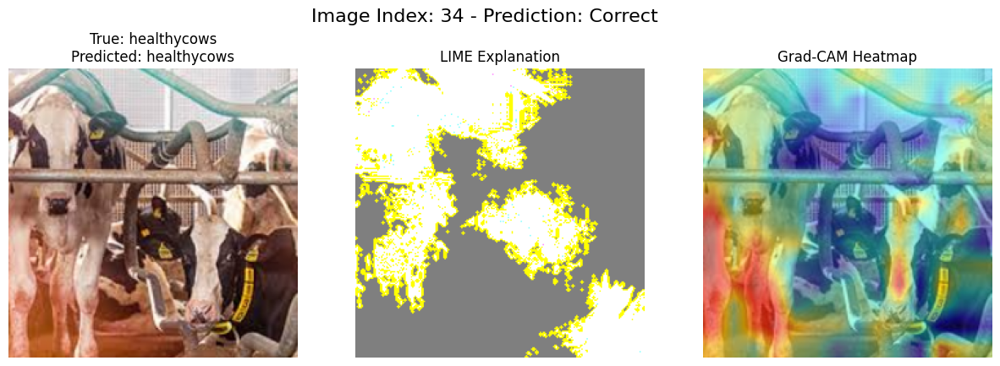

  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


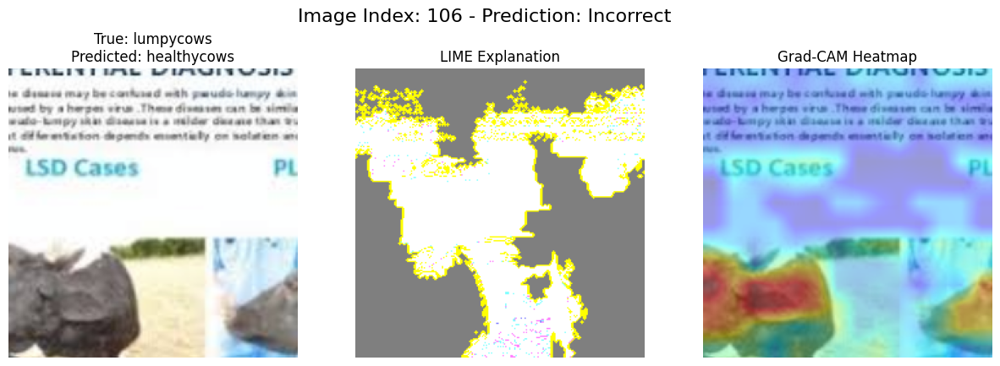

  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipython-input-183781683.py:69: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


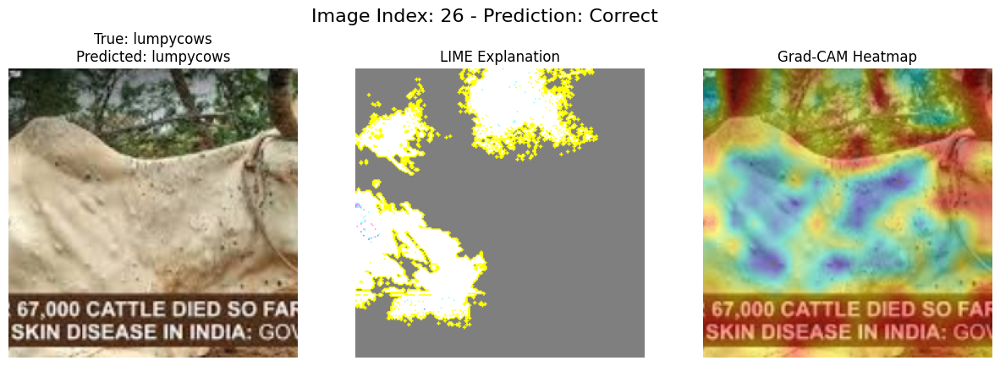

In [ ]:
# --- Step 9: XAI Analysis on 20 Random Test Images ---
print("\n--- Step 9: Analyzing 20 Random Test Images with LIME and Grad-CAM ---")

import random

# --- Collect all images, labels, and predictions from the test set ---
all_test_images = []
all_true_labels = []
all_predicted_labels = []

eval_model.eval()
with torch.no_grad():
    for inputs, labels in dataloaders['test']:
        inputs_cpu = inputs.cpu()
        labels_cpu = labels.cpu()

        outputs = eval_model(inputs.to(device))
        _, preds = torch.max(outputs, 1)
        preds_cpu = preds.cpu()

        for i in range(inputs.size(0)):
            all_test_images.append(inputs_cpu[i])
            all_true_labels.append(labels_cpu[i].item())
            all_predicted_labels.append(preds_cpu[i].item())

print(f"Collected {len(all_test_images)} total test images.")

# --- Randomly select 20 images to visualize ---
num_to_visualize = min(20, len(all_test_images))
random_indices = random.sample(range(len(all_test_images)), num_to_visualize)

if num_to_visualize > 0:
    # --- Grad-CAM Setup ---
    gradients = {}
    activations = {}
    def backward_hook(module, grad_input, grad_output):
        gradients['value'] = grad_output[0]
    def forward_hook(module, input, output):
        activations['value'] = output

    if hasattr(eval_model, '_orig_mod'):
        target_layer = eval_model._orig_mod.encoder.ln
    else:
        target_layer = eval_model.encoder.ln

    hook_handle_forward = target_layer.register_forward_hook(forward_hook)
    hook_handle_backward = target_layer.register_full_backward_hook(backward_hook)

    # --- Loop through the random images and plot explanations ---
    for i in random_indices:
        img_tensor = all_test_images[i]
        true_label_idx = all_true_labels[i]
        pred_label_idx = all_predicted_labels[i]

        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        is_correct = "Correct" if true_label_idx == pred_label_idx else "Incorrect"
        fig.suptitle(f"Image Index: {i} - Prediction: {is_correct}", fontsize=16)

        # --- LIME Explanation ---
        explainer = lime_image.LimeImageExplainer()
        img_for_lime = (img_tensor.permute(1, 2, 0).numpy() * 255).astype(np.uint8)
        explanation = explainer.explain_instance(
            img_for_lime, batch_predict_fn, top_labels=2, hide_color=0, num_samples=1000
        )
        temp, mask = explanation.get_image_and_mask(
            explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True
        )

        # --- Grad-CAM Explanation ---
        input_tensor_cam = img_tensor.unsqueeze(0).to(device)
        eval_model.zero_grad()
        output = eval_model(input_tensor_cam)
        pred_class_score = output[0, pred_label_idx]
        pred_class_score.backward()

        act = activations['value'].detach().cpu()
        grad = gradients['value'].detach().cpu()
        weights = grad.mean(dim=1, keepdim=True)
        cam_result = (F.relu(act) * weights).sum(dim=2).squeeze(0)

        side_len = int((cam_result.shape[0] - 1)**0.5)
        cam_result = cam_result[1:].reshape(side_len, side_len).numpy()
        cam_result = cv2.resize(cam_result, (224, 224))
        cam_result = (cam_result - np.min(cam_result)) / (np.max(cam_result) - np.min(cam_result) + 1e-8)

        # --- Display ---
        img_display = img_tensor.permute(1, 2, 0).numpy()
        mean, std = np.array([0.485, 0.456, 0.406]), np.array([0.229, 0.224, 0.225])
        img_display = std * img_display + mean
        img_display = np.clip(img_display, 0, 1)

        axes[0].imshow(img_display)
        axes[0].set_title(f"True: {class_names[true_label_idx]}\nPredicted: {class_names[pred_label_idx]}")
        axes[0].axis('off')

        axes[1].imshow(mark_boundaries(temp / 2 + 0.5, mask))
        axes[1].set_title("LIME Explanation")
        axes[1].axis('off')

        heatmap = cv2.applyColorMap(np.uint8(255 * cam_result), cv2.COLORMAP_JET)
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
        superimposed_img = heatmap * 0.4 + (img_display * 255).astype(np.uint8) * 0.6
        superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)
        axes[2].imshow(superimposed_img)
        axes[2].set_title("Grad-CAM Heatmap")
        axes[2].axis('off')

        plt.show()

    hook_handle_forward.remove()
    hook_handle_backward.remove()

else:
    print("No test images found to visualize.")

Cell: Statistical Analysis of Optuna Results
This cell uses Optuna's powerful built-in visualization tools to analyze the results of the hyperparameter search we just completed. It assumes the study object from the previous cell is still in memory.

It will generate five different plots to help us understand the tuning process:

Optimization History: Shows how the model's accuracy improved with each new trial.

Hyperparameter Importance: Reveals which setting (lr or optimizer) had the biggest impact on the outcome.

Parallel Coordinate Plot: Helps visualize which combination of parameters led to the best results.

Slice Plot: Shows the performance of each hyperparameter individually.

Trial Timeline: Visualizes how long each trial took to complete.

In [ ]:
# --- Statistical Analysis of Optuna Hyperparameter Tuning ---
print("--- Generating visualizations for the Optuna study ---")

# Optuna's visualization tools use plotly, so it's good practice to ensure it's installed.
!pip install -q plotly

import optuna

# --- 1. Optimization History Plot ---
print("\n--- 1. Optimization History ---")
print("This plot shows the validation accuracy for every trial (blue dots) and the best accuracy found so far (orange line).")
print("Insight: You can see how quickly the study found good results and whether it was still improving towards the end.")
fig1 = optuna.visualization.plot_optimization_history(study)
fig1.show()

# --- 2. Hyperparameter Importance Plot ---
print("\n--- 2. Hyperparameter Importance ---")
print("This plot shows which hyperparameter had the biggest impact on the model's accuracy.")
print("Insight: A high importance score means that changing this parameter (e.g., 'lr') significantly affected the outcome.")
fig2 = optuna.visualization.plot_param_importances(study)
fig2.show()

# --- 3. Parallel Coordinate Plot ---
print("\n--- 3. Parallel Coordinate Plot ---")
print("This plot links hyperparameter values to their results. Each line is a single trial.")
print("Insight: You can follow the lines to see which combinations led to the best scores (the highest values on the right). It's great for spotting patterns, like seeing that 'AdamW' consistently outperformed 'SGD'.")
fig3 = optuna.visualization.plot_parallel_coordinate(study)
fig3.show()

# --- 4. Slice Plot ---
print("\n--- 4. Slice Plot ---")
print("This plot shows a 'slice' of the search space for each hyperparameter.")
print("Insight: It's especially useful for seeing the effect of the learning rate ('lr'). You can identify the range of learning rates that produced the best results.")
fig4 = optuna.visualization.plot_slice(study)
fig4.show()

# --- 5. Trial Timeline Plot ---
print("\n--- 5. Trial Timeline ---")
print("This plot shows when each trial started and how long it took to complete.")
print("Insight: You can see if certain hyperparameter combinations (like using the SGD optimizer) took longer to train than others.")
fig5 = optuna.visualization.plot_timeline(study)
fig5.show()

--- Generating visualizations for the Optuna study ---

--- 1. Optimization History ---
This plot shows the validation accuracy for every trial (blue dots) and the best accuracy found so far (orange line).
Insight: You can see how quickly the study found good results and whether it was still improving towards the end.



--- 2. Hyperparameter Importance ---
This plot shows which hyperparameter had the biggest impact on the model's accuracy.
Insight: A high importance score means that changing this parameter (e.g., 'lr') significantly affected the outcome.



--- 3. Parallel Coordinate Plot ---
This plot links hyperparameter values to their results. Each line is a single trial.
Insight: You can follow the lines to see which combinations led to the best scores (the highest values on the right). It's great for spotting patterns, like seeing that 'AdamW' consistently outperformed 'SGD'.



--- 4. Slice Plot ---
This plot shows a 'slice' of the search space for each hyperparameter.
Insight: It's especially useful for seeing the effect of the learning rate ('lr'). You can identify the range of learning rates that produced the best results.



--- 5. Trial Timeline ---
This plot shows when each trial started and how long it took to complete.
Insight: You can see if certain hyperparameter combinations (like using the SGD optimizer) took longer to train than others.


In [ ]:
# Download the external validation dataset from Kaggle
!kaggle datasets download -d jaynilgaglani/cattle-disease-detection

# Unzip the downloaded file to create the folder
!unzip cattle-disease-detection.zip

403 Client Error: Forbidden for url: https://www.kaggle.com/api/v1/datasets/metadata/jaynilgaglani/cattle-disease-detection
unzip:  cannot find or open cattle-disease-detection.zip, cattle-disease-detection.zip.zip or cattle-disease-detection.zip.ZIP.


External Validation

In [ ]:
import torch
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import timm

# --- 1. Configuration ---
# CORRECTED PATH: Points to the folder you just unzipped in your current directory.
external_dataset_path = 'Cattle Disease Detection'

# Path to your saved model weights
model_path = 'best_model.pth'

# Define the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# --- 2. Data Loading and Transformations ---
# (The rest of the code remains the same)
valid_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load the external dataset
external_dataset = ImageFolder(root=external_dataset_path, transform=valid_transform)
external_loader = DataLoader(external_dataset, batch_size=32, shuffle=False)

# Get class names
class_names = external_dataset.classes
print(f"Classes found in external dataset: {class_names}")

# (The rest of the code for loading the model, evaluating, and reporting is the same)
# ...

Using device: cuda


FileNotFoundError: [Errno 2] No such file or directory: 'Cattle Disease Detection'